In [654]:
%reset -f
%load_ext autoreload
%autoreload 2

import os
import time
import sys
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import glob
import math
from sklearn.linear_model import LinearRegression
import figurefirst as fifi
sys.path.append('../utils_2')
import figure_functions as ff
from pybounds import SlidingEmpiricalObservabilityMatrix, SlidingFisherObservability, colorline
sys.path.append('../model')
from drone_model_with_PWM import DroneSimulator
from drone_model_with_PWM import DroneModel
from drone_model_with_PWM import DroneParameters
sys.path.append('../EKF')
from ekf import ekf as EKF
import ukf_sqrt.ukf_sqrt as ukf_sqrt
from scipy.optimize import minimize
from scipy.integrate import cumtrapz
sys.path.append('../trajectories')
from trajectory_gen import TrajectoryGenerator
import figurefirst as fifi
from IPython.display import display,SVG
import sympy as sp
import matplotlib.patches as patches

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# set the parameters for your system

In [655]:
g = 9.81  # gravity [m/s^2]
m = 0.086  # mass [kg]
M = 2.529  # mass [kg]
Mm = 4 * m + M  # total mass [kg]
L = 0.2032  # length [m]
R = 0.1778  # average body radius [m]
I_x = .491
# self.I_x = 2 * (self.M * self.R ** 2) / 5 + 2 * self.m * self.L ** 2  # [kg*m^2] moment of inertia about x
I_y = .387
# self.I_y = 2 * (self.M * self.R ** 2) / 5 + 2 * self.m * self.L ** 2  # [kg*m^2] moment of inertia about y
I_z = .667
# self.I_z = 2 * (self.M * self.R ** 2) / 5 + 4 * self.m * self.L ** 2  # [kg*m^2] moment of inertia about y
# b = 1.8311  # thrust coefficient
# d = 1  # drag constant
# C = 0.1  # drag coefficient from ground speed plus air speed
b = 1.34
d = 1.0
C = 0.1

PARAMS = {
        'g': g,
        'm': m,
        'M': M,
        'Mm': Mm,
        'L': L,
        'R': R,
        'I_x': I_x,
        'I_y': I_y,
        'I_z': I_z,
        'b': b,
        'd': d,
        'C': C
                }

# Build the trajectory set points to go into MPC

TrajectoryGenerator initialized.
Generating motif: sine


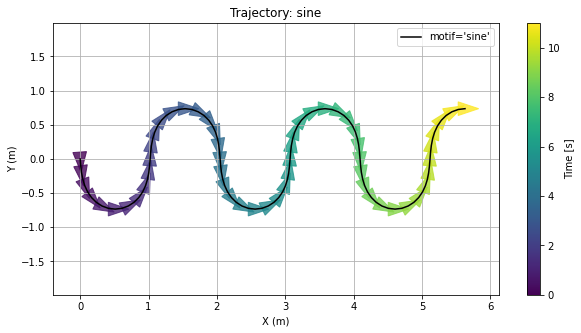

In [656]:
###################################################
# mapping = {
#             'all':  self.all_motifs,
#             'sine': self.sine_wave_motif,
#             'constant_accel': self.constant_accel_motif,
#             'constant_velocity': self.constant_velocity_motif,
#             'constant_velocity_yaw': self.constant_velocity_yaw_motif
#         }
EVERYTHING= ['constant_velocity' , 'constant_velocity_yaw', 'constant_accel', 'sine','sine_constant_heading']
###################################################

traj_gen = TrajectoryGenerator()

motif_type= 'sine'  # 'sine', 'constant_accel', 'constant_velocity', 'constant_velocity_yaw', or 'EVERYTHING
if motif_type == 'EVERYTHING':
    # run all motifs except 'all' save in dictionary for each output ie tsim['constant_velocity'] and tsim['sine_wave'] ect
    tsim = {}
    dt = {}
    v_x = {}
    v_y = {}
    psi = {}
    psi_global = {}
    x_dot = {}
    y_dot = {}
    z = {}
    X0_sim = {}
    for motif in EVERYTHING:
        print(f'Generating motif: {motif}')
        tsim[motif], dt[motif], v_x[motif], v_y[motif], psi[motif], psi_global[motif], x_dot[motif], y_dot[motif], z[motif], X0_sim[motif] = traj_gen.motifs(motif=motif)
        traj_gen.plot_trajectory(motif=motif)
else:
    print(f'Generating motif: {motif_type}')
    tsim, dt, v_x, v_y, psi, psi_global, x_dot, y_dot, z, X0_sim = traj_gen.motifs(motif=motif_type)
    traj_gen.plot_trajectory()



In [657]:
# remove the 7 and 8th elements from X0_sim
X0_sim = np.delete(X0_sim, [6, 7], axis=0)
X0_sim

array([ 0. ,  0. ,  2. ,  1. ,  0. ,  0. , -1.5,  0. ,  0. ,  0. ,  1.5,
        2. ])

# run MPC

In [658]:
if motif_type == 'EVERYTHING':
    print('Running simulation for all motifs...')
    simulator = {}
    t_sim = {}
    x_sim = {}
    u_sim = {}
    y_sim = {}
    for motif in EVERYTHING:
        print(f'Running simulation for motif: {motif}')
        # Create simulator
        simulator[motif] = DroneSimulator(dt=dt[motif], mpc_horizon=50, r_u=1e-4, control_mode='velocity_body_level',params=PARAMS)
        # Update the setpoints
        simulator[motif].update_setpoint(v_x=v_x[motif], v_y=v_y[motif], psi=psi[motif], z=z[motif], wx=np.ones_like(z[motif])*X0_sim[motif][12], wy=np.ones_like(z[motif])*X0_sim[motif][13])
        # Run simulation
        st = time.time()
        t_sim[motif], x_sim[motif], u_sim[motif], y_sim[motif] = simulator[motif].simulate(x0=X0_sim[motif], mpc=True, return_full_output=True)
        et = time.time()
        print('elapsed time:', et-st)
else:
    print(f'Running simulation for just motif: {motif_type}')
    # Create simulator
    simulator = DroneSimulator(dt=dt, mpc_horizon=50, r_u=1e-4, control_mode='velocity_body_level',params=PARAMS)
    # Update the setpoints
    simulator.update_setpoint(v_x=v_x, v_y=v_y, psi=psi, z=z, wx=np.ones_like(z)*X0_sim[12-2], wy=np.ones_like(z)*X0_sim[13-2])
    # Run simulation
    st = time.time()
    # t_sim, x_sim, u_sim, y_sim = simulator.simulate(x0=X0_sim, u=U_real, mpc=False, return_full_output=True)
    t_sim, x_sim, u_sim, y_sim = simulator.simulate(x0=X0_sim, mpc=True, return_full_output=True)
    et = time.time()
    print('elapsed time:', et-st)

Running simulation for just motif: sine
Drone parameters: {'g': 9.81, 'm': 0.086, 'M': 2.529, 'Mm': 2.8729999999999998, 'L': 0.2032, 'R': 0.1778, 'I_x': 0.491, 'I_y': 0.387, 'I_z': 0.667, 'b': 1.34, 'd': 1.0, 'C': 0.1}
elapsed time: 50.24660015106201


In [659]:
# dictionary to csv 
y_sim.keys()
y_sim_df = pd.DataFrame(y_sim)
# add 'output' to the names of the columns
y_sim_df.columns = [f'output_{col}' for col in y_sim_df.columns]
# y_sim_df.to_csv(f'/home/austinlopez/Drone_AFRL/simulation/simulated_outputs_{motif_type}.csv', index=False)
x_sim_df = pd.DataFrame(x_sim)
# add 'state' to the names of the columns
x_sim_df.columns = [f'state_{col}' for col in x_sim_df.columns]
# x_sim_df.to_csv(f'/home/austinlopez/Drone_AFRL/simulation/simulated_states_{motif_type}.csv', index=False)
u_sim_df = pd.DataFrame(u_sim)
# add 'control' to the names of the columns
u_sim_df.columns = [f'control_{col}' for col in u_sim_df.columns]
# u_sim_df.to_csv(f'/home/austinlopez/Drone_AFRL/simulation/simulated_inputs_{motif_type}.csv', index=False)
t_sim_df = pd.DataFrame(t_sim, columns=['time'])

#combine all dataframes into one
simulated_data_df = pd.concat([t_sim_df, x_sim_df, u_sim_df, y_sim_df], axis=1)

print( simulated_data_df.head() )
# save the dataframe to a csv file
simulated_data_df.to_csv(f'/home/austinlopez/Drone_AFRL/simulation/simulated_data_test_{motif_type}.csv', index=False)

   time   state_x   state_y   state_z  state_v_x  state_v_y  state_v_z  \
0   0.0  0.000000  0.000000  2.000000   1.000000   0.000000   0.000000   
1   0.1  0.007942 -0.099680  1.993007   0.999960   0.000045  -0.139780   
2   0.2  0.019447 -0.198999  1.984695   0.999993  -0.000082  -0.026518   
3   0.3  0.038126 -0.297198  1.986579   1.000008  -0.000095   0.064129   
4   0.4  0.067220 -0.392800  1.993513   1.000021  -0.000021   0.074545   

   state_psi  state_omega_x  state_omega_y  ...  output_wy  output_Ax  \
0  -1.500000       0.000000       0.000000  ...        2.0  -0.001238   
1  -1.482601      -0.004731      -0.028510  ...        2.0  -0.002812   
2  -1.428255      -0.011939      -0.080301  ...        2.0  -0.005096   
3  -1.337128      -0.018027      -0.152630  ...        2.0  -0.007064   
4  -1.213411      -0.018658      -0.244506  ...        2.0  -0.009065   

   output_Ay  output_Az  output_Axt  output_Ayt  output_rx  output_ry  \
0   0.174156  -1.400233   -0.001238    0.17

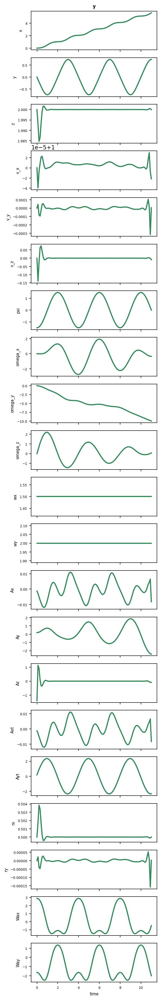

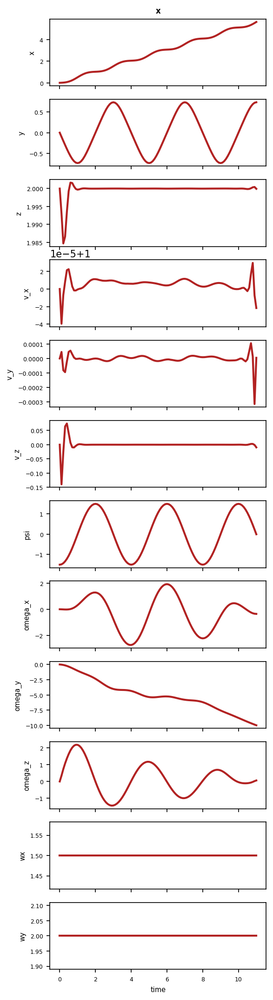

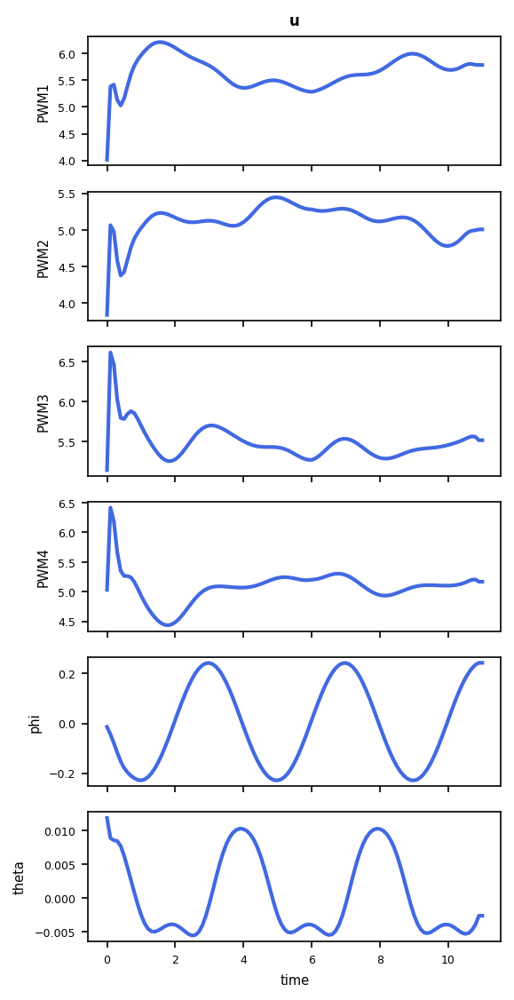

In [661]:
simulator.plot(name='y')
simulator.plot(name='x')
simulator.plot(name='u')

In [662]:
x_sim_test = pd.DataFrame(x_sim)

In [663]:
# drone_model = DroneModel()
# f_c=drone_model.f_c_car

# def outer(func):
#     def wrapper(*args, **kwargs):
#         global dt
#         args = list(args) + [dt]
#         value = func(*args)
#         return value
#     return wrapper

# f_c = outer(drone_model.f_c_car)

In [666]:
drone_model = DroneModel()
sim=drone_model.simulate

def outer(func):
    def wrapper(*args, **kwargs):
        global dt
        args = list(args) + [dt]
        value = func(*args)
        return value
    return wrapper

sim = outer(drone_model.simulate)

In [667]:
x_sim_df = pd.DataFrame(x_sim)
u_sim_df = pd.DataFrame(u_sim)

t_sim_new, x_sim_new, u_sim_new, y_sim_new = sim(x_sim_df, u_sim_df)

In [615]:
t_sim

array([ 0.  ,  0.05,  0.1 ,  0.15,  0.2 ,  0.25,  0.3 ,  0.35,  0.4 ,
        0.45,  0.5 ,  0.55,  0.6 ,  0.65,  0.7 ,  0.75,  0.8 ,  0.85,
        0.9 ,  0.95,  1.  ,  1.05,  1.1 ,  1.15,  1.2 ,  1.25,  1.3 ,
        1.35,  1.4 ,  1.45,  1.5 ,  1.55,  1.6 ,  1.65,  1.7 ,  1.75,
        1.8 ,  1.85,  1.9 ,  1.95,  2.  ,  2.05,  2.1 ,  2.15,  2.2 ,
        2.25,  2.3 ,  2.35,  2.4 ,  2.45,  2.5 ,  2.55,  2.6 ,  2.65,
        2.7 ,  2.75,  2.8 ,  2.85,  2.9 ,  2.95,  3.  ,  3.05,  3.1 ,
        3.15,  3.2 ,  3.25,  3.3 ,  3.35,  3.4 ,  3.45,  3.5 ,  3.55,
        3.6 ,  3.65,  3.7 ,  3.75,  3.8 ,  3.85,  3.9 ,  3.95,  4.  ,
        4.05,  4.1 ,  4.15,  4.2 ,  4.25,  4.3 ,  4.35,  4.4 ,  4.45,
        4.5 ,  4.55,  4.6 ,  4.65,  4.7 ,  4.75,  4.8 ,  4.85,  4.9 ,
        4.95,  5.  ,  5.05,  5.1 ,  5.15,  5.2 ,  5.25,  5.3 ,  5.35,
        5.4 ,  5.45,  5.5 ,  5.55,  5.6 ,  5.65,  5.7 ,  5.75,  5.8 ,
        5.85,  5.9 ,  5.95,  6.  ,  6.05,  6.1 ,  6.15,  6.2 ,  6.25,
        6.3 ,  6.35,

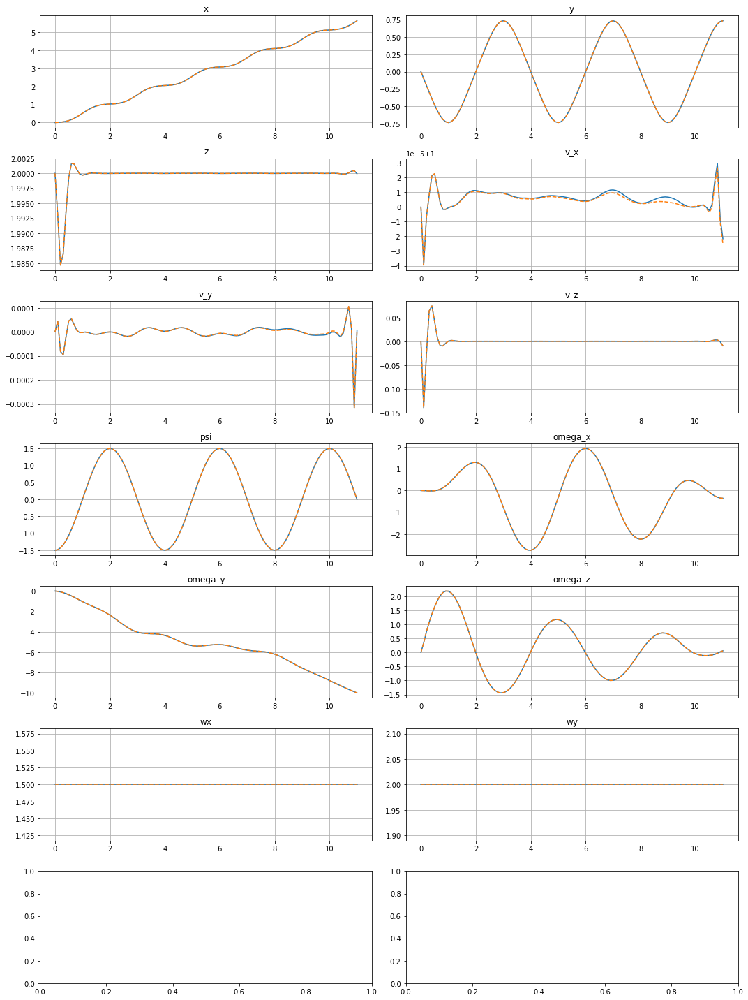

In [668]:
# plot all the states comparing x_sim and x_sim_new
# dict_keys(['x', 'y', 'z', 'v_x', 'v_y', 'v_z', 'phi', 'theta', 'psi', 'omega_x', 'omega_y', 'omega_z', 'wx', 'wy'])
fig, axs = plt.subplots(7, 2, figsize=(15, 20))
axs = axs.flatten()
# state_names = ['x', 'y', 'z', 'v_x', 'v_y', 'v_z', 'phi', 'theta', 'psi', 'omega_x', 'omega_y', 'omega_z', 'wx', 'wy']
state_names = ['x', 'y', 'z', 'v_x', 'v_y', 'v_z', 'psi', 'omega_x', 'omega_y', 'omega_z', 'wx', 'wy']
for i, state in enumerate(state_names):
    axs[i].plot(t_sim, x_sim_df[f'{state}'])
    axs[i].plot(t_sim_new, x_sim_new[f'{state}'], linestyle='--')
    axs[i].set_title(state)
    # axs[i].legend()
    axs[i].grid()
plt.tight_layout()
plt.show()


# Observability

In [617]:
drone_model = DroneModel()
z_function=drone_model.z_function

In [618]:
# Set time-window
time_window = 8
# Construct O in sliding windows
st = time.time()
z_state_names = ['x', 'y', 'z', 'g', 'beta', 'v_z', 'phi', 'theta', 'psi', 'omega_x', 'omega_y', 'omega_z', 'W', 'zeta']
SEOM = SlidingEmpiricalObservabilityMatrix(simulator, t_sim, x_sim, u_sim,
                                           w=5, eps=1e-5,
                                           z_function=z_function,
                                           z_state_names=z_state_names)
et = time.time()
print('elapsed time:', et-st)

elapsed time: 70.8563666343689


In [619]:
# Get O's
O_sliding = SEOM.get_observability_matrix()
n_window = len(O_sliding)
print(n_window, 'windows')
SEN=['IMU', 'IMU + OPTIC_FLOW', 'IMU + WIND', 'IMU + WIND + OPTIC_FLOW']
sen='ALL'  
if sen == 'ALL':
    print('using all sensors')
    o_sensors = {}
    for sensors in SEN:
        if sensors == 'IMU':
            o_sensors[sensors] = ['phi', 'theta', 'psi', 'omega_x', 'omega_y', 'omega_z', 'Axt', 'Ayt', 'Az']
        elif sensors == 'IMU + OPTIC_FLOW':
            o_sensors[sensors] = ['phi', 'theta', 'psi', 'omega_x', 'omega_y', 'omega_z', 'Axt', 'Ayt', 'Az', 'rx', 'ry']
        elif sensors == 'IMU + WIND':
            o_sensors[sensors] = ['phi', 'theta', 'psi', 'omega_x', 'omega_y', 'omega_z', 'Axt', 'Ayt', 'Az', 'Wax', 'Way']
        elif sensors == 'IMU + WIND + OPTIC_FLOW':
            o_sensors[sensors] = ['phi', 'theta', 'psi', 'omega_x', 'omega_y', 'omega_z',
                                    'Axt', 'Ayt', 'Az', 'rx', 'ry', 'Wax', 'Way']

elif sen == 'IMU':
    o_sensors = ['phi', 'theta', 'psi', 'omega_x', 'omega_y', 'omega_z', 'Ax', 'Ay', 'Az']
elif sen == 'IMU + OPTIC_FLOW':
    o_sensors = ['phi', 'theta', 'psi', 'omega_x', 'omega_y', 'omega_z', 'Ax', 'Ay', 'Az', 'rx', 'ry']
elif sen == 'IMU + WIND':
    o_sensors = ['phi', 'theta', 'psi', 'omega_x', 'omega_y', 'omega_z', 'Ax', 'Ay', 'Az', 'Wax', 'Way']
elif sen == 'IMU + WIND + OPTIC_FLOW':
    o_sensors = ['phi', 'theta', 'psi', 'omega_x', 'omega_y', 'omega_z', 'a_x', 'a_y',
                 'Ax', 'Ay', 'Az', 'rx', 'ry', 'Wax', 'Way']
elif sen == 'IMUt':
    o_sensors = ['phi', 'theta', 'psi', 'omega_x', 'omega_y', 'omega_z', 'Axt', 'Ayt', 'Az']

o_states = None
# o_states = simulator.state_names[0:-5] + ['m', 'C', 'I_x']

window_size = 5
o_time_steps = np.arange(0, window_size, step=1)

217 windows
using all sensors


In [620]:
O_sliding[0]

,,x,y,z,g,beta,v_z,phi,theta,psi,omega_x,omega_y,omega_z,W,zeta
sensor,time_step,,,,,,,,,,,,,,
x,0,1.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
y,0,0.000000e+00,1.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
z,0,0.000000e+00,0.000000e+00,1.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
v_x,0,0.000000e+00,0.000000e+00,0.000000e+00,1.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
v_y,0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,1.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Ayt,4,3.164136e-10,1.276201e-08,-2.775558e-11,0.002345,-0.034486,1.735834e-08,-10.633140,-0.722902,0.061300,-2.135456,-0.073650,0.011714,0.024363,-0.061300
rx,4,1.065814e-09,-5.151435e-09,-2.522089e-01,0.499022,0.033926,-5.026662e-02,-0.068909,1.003869,0.006157,-0.005858,0.110055,-0.003620,-0.002479,-0.006157
ry,4,-7.316196e-11,-6.520717e-09,1.407328e-03,-0.033926,0.499022,2.804745e-04,-1.010649,-0.068711,0.006196,-0.110777,-0.003146,-0.099251,0.002463,-0.006196


In [621]:
# Compute the Fisher information & inverse for each window and store the minimum error variance
if sen == 'ALL':
    print('Computing Fisher Information for all sensors')
    SFO = {}
    EV_aligned = {}
    EV_no_nan = {}
    for sensors in SEN:
        print(f'Computing Fisher Information for sensors: {sensors}')
        SFO[sensors] = SlidingFisherObservability(SEOM.O_df_sliding, time=SEOM.t_sim, lam=1e-6, R=0.5,
                                                  states=z_state_names, sensors=o_sensors[sensors], time_steps=o_time_steps, w=window_size)
        EV_aligned[sensors] = SFO[sensors].get_minimum_error_variance()
        EV_no_nan[sensors] = EV_aligned[sensors].fillna(method='bfill').fillna(method='ffill')
else:
    SFO = SlidingFisherObservability(SEOM.O_df_sliding, time=SEOM.t_sim, lam=1e-6, R=0.5**2,
                                 states=z_state_names, sensors=o_sensors, time_steps=o_time_steps, w=window_size)

    EV_aligned = SFO.get_minimum_error_variance()
    EV_no_nan = EV_aligned.fillna(method='bfill').fillna(method='ffill')

Computing Fisher Information for all sensors
Computing Fisher Information for sensors: IMU
Computing Fisher Information for sensors: IMU + OPTIC_FLOW
Computing Fisher Information for sensors: IMU + WIND
Computing Fisher Information for sensors: IMU + WIND + OPTIC_FLOW


In [622]:
# np.log10(EV_no_nan[SEN[3]])

In [623]:
# plt.plot(EV_no_nan[SEN[3]]['time'], np.log10(EV_no_nan[SEN[3]]['g']), label='wx')
# plt.yscale('log')

In [624]:
import numpy as np
# set max and min to 1e6 and 1e-2 respectively
def flip_scale(data, min_val=-2, max_val=6):
    """
    Flip values in `data` across the interval [min_val, max_val],
    then shift so that the new minimum is 0.

    In other words:
      1. Clip the input to [min_val, max_val].
      2. Flip by:  flipped = (min_val + max_val) - clipped.
      3. Shift up by subtracting min_val, so that the final range is [0, max_val - min_val].

    Parameters
    ----------
    data : array‐like
        Numeric array to transform.
    min_val : float
        Lower bound of the original range (default = -2).
    max_val : float
        Upper bound of the original range (default = 6).

    Returns
    -------
    np.ndarray
        Flipped + shifted array, spanning [0, max_val - min_val].
    """
    arr = np.clip(data, min_val, max_val)
    flipped = (min_val + max_val) - arr
    shifted = flipped - min_val
    return shifted

# STATES = [
#     'x', 'y', 'z',
#     'v_x', 'v_y', 'v_z',
#     'phi', 'theta', 'psi',
#     'omega_x', 'omega_y', 'omega_z',
#     'wx', 'wy'
# ]

STATES = [
    'x', 'y', 'z',
    'g', 'beta', 'v_z',
    'phi', 'theta', 'psi',
    'omega_x', 'omega_y', 'omega_z',
    'W', 'zeta'
]

if sen == 'ALL':
# ---------------------------------------------------------------------
# 3) Build a dict-of-dicts to hold flipped data, meshes, etc.
# ---------------------------------------------------------------------
    flipped   = {state: {} for state in STATES}
    neg_flipped = {state: {} for state in STATES}
    X1        = {state: {} for state in STATES}
    X2        = {state: {} for state in STATES}
    Y1        = {state: {} for state in STATES}
    Y2        = {state: {} for state in STATES}
    dist_map  = {state: {} for state in STATES}
    X_mesh    = {state: {} for state in STATES}
    Y_mesh    = {state: {} for state in STATES}
    C_map     = {state: {} for state in STATES}


    # ---------------------------------------------------------------------
    # 4) Loop over every (state, sensor) pair and compute the arrays:
    # ---------------------------------------------------------------------
    for state in STATES:
        # print(f"\n=== Processing STATE: {state} ===")
        for sensor in SEN:
            # 4a) Flip‐and‐shift the log10(data):
            raw = EV_no_nan[sensor][state]
            flipped[state][sensor] = flip_scale(np.log10(raw))
            neg_flipped[state][sensor] = -flipped[state][sensor]

            # 4b) Time‐arrays (both x1 and x2 are just “time” for your plots):
            X1[state][sensor] = EV_no_nan[sensor]['time']
            X2[state][sensor] = EV_no_nan[sensor]['time']

            # 4c) The two y‐lines (positive flipped and negative flipped):
            Y1[state][sensor] = flipped[state][sensor]
            Y2[state][sensor] = neg_flipped[state][sensor]

            # 4d) Distance‐map (this is the value you want to color by):
            dist_map[state][sensor] = Y1[state][sensor]  # shape (N,), we’ll slice below

            # 4e) Build the mesh (“2×N” for pcolormesh):
            X_mesh[state][sensor] = np.vstack([X1[state][sensor], X2[state][sensor]])  # shape (2,N)
            Y_mesh[state][sensor] = np.vstack([Y1[state][sensor], Y2[state][sensor]])  # shape (2,N)

            # 4f) C_map needs to be shape (1, N−1), so we drop the last element and add newaxis:
            C_map[state][sensor] = dist_map[state][sensor][:-1][np.newaxis, :]

 
else:
    flipped_v_x = flip_scale(np.log10(EV_no_nan['v_x']))

    plt.plot(flipped_v_x,EV_no_nan['time'], label='v_x')
    plt.plot(-1*flipped_v_x,EV_no_nan['time'], label='v_x')
    plt.ylim(11,0)

    # --- (1) Example data; replace with yours ----------
    x1  = EV_no_nan['time']
    x2  = EV_no_nan['time']
    y1 = flipped_v_x
    y2 = flipped_v_x*-1  # Flipped version of y1

    # --- (2) Compute distance between curves at each x ---
    dist = y1   # length N

    # --- (3) Build mesh arrays ---
    X_mesh = np.vstack([x1, x2])          # shape (2, N)
    Y_mesh = np.vstack([y1, y2])        # shape (2, N)
    C      = dist[:-1][np.newaxis, :]   # shape (1, N-1)

    # --- (4) Plot: ---------------------------------------
    fig, ax = plt.subplots(figsize=(7, 2))

    # (4a) First draw the two lines (optional, but often useful):
    ax.plot(x1, y1, color='blue', lw=2.5, label="y₁(x)")
    ax.plot(x2, y2, color='blue', lw=2.5, label="y₂(x)")

    # (4b) Now overlay the “distance‐colormap” between them:
    pc = ax.pcolormesh(
        X_mesh, Y_mesh, C,
        cmap='inferno',
        shading='flat',         # “flat” means each quad is colored uniformly
        edgecolor='none',
        vmin=0, vmax=8
    )

    # (4c) Add a colorbar for reference:
    cbar = plt.colorbar(pc, ax=ax, label='Observability')

    # (4d) Labels/legend:
    ax.set_xlabel("time")
    # ax.set_ylabel("Observability")
    # ax.set_title("observability for v_x")
    # remove yticks 
    ax.set_yticks([])
    # remove border
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    # ax.spines['bottom'].set_visible(False)
    # ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()


/tmp/ipykernel_410557/2509245495.py:91: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  C_map[state][sensor] = dist_map[state][sensor][:-1][np.newaxis, :]


In [625]:
# flipped
# # print max and min of all states and sensors
# for state in STATES:
#     for sensor in SEN:
#         print(f"{state} - {sensor}: min={np.log10(EV_no_nan[sensor][state].min()):.2f}, max={np.log10(EV_no_nan[sensor][state].max()):.2f}")

### Plot state observability

Plotting heatmap for sensors: IMU
Plotting heatmap for sensors: IMU + OPTIC_FLOW
Plotting heatmap for sensors: IMU + WIND
Plotting heatmap for sensors: IMU + WIND + OPTIC_FLOW


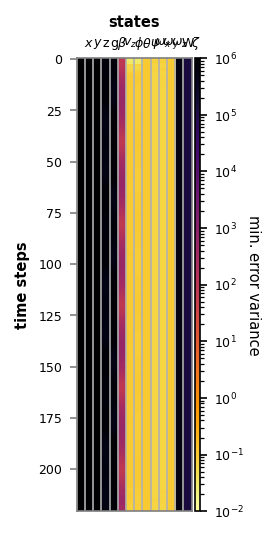

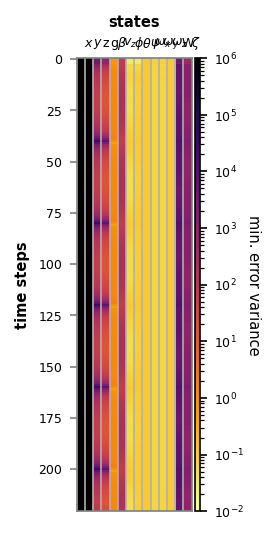

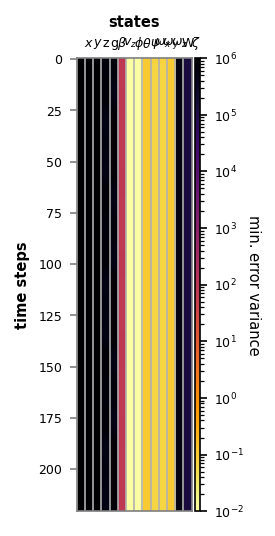

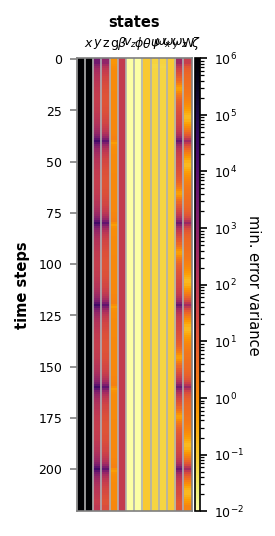

In [626]:
if sen == 'ALL':
    for sensors in SEN:
        # print(f'Plotting heatmap for sensors: {sensors}')
        if o_states is None:
            state_labels = STATES
        else:
            state_labels = STATES
        print(f'Plotting heatmap for sensors: {sensors}')
        cnorm, cmap, log_ticks = ff.plot_heatmap_log_timeseries(EV_no_nan[sensors].iloc[:, 2:].values, log_ticks=(-2, 6),
                                                                data_labels=state_labels, y_label='min. error variance')
else:
    if o_states is None:
        state_labels = STATES
    else:
        state_labels = STATES

    cnorm, cmap, log_ticks = ff.plot_heatmap_log_timeseries(EV_no_nan.iloc[:, 2:].values, log_ticks=(-2, 6),
                                                            data_labels=state_labels, y_label='min. error variance')

# set up EKF

In [627]:
SENSORS = ['IMU', 'IMU + OPTIC_FLOW', 'IMU + WIND', 'IMU + WIND + OPTIC_FLOW']
Y_SWEEP = 'ALL'  # 'IMU', 'IMU + OPTIC_FLOW', 'IMU + WIND', 'IMU + WIND + OPTIC_FLOW', or 'ALL' 
# if Y_SWEEP == 'ALL':
#     # run all Y_SWEEPs
#     Y_SWEEP = ['IMU', 'IMU + OPTIC_FLOW', 'IMU + WIND', 'IMU + WIND + OPTIC_FLOW']
# else:
#     # just run the specified Y_SWEEP
#     Y_SWEEP = Y_SWEEP.copy()



### get the EKF model

In [628]:
drone_model = DroneModel()
f_c=drone_model.f_c_car

def outer(func):
    def wrapper(*args, **kwargs):
        global dt
        args = list(args) + [dt]
        value = func(*args)
        return value
    return wrapper

f_c = outer(drone_model.f_c_car)

def make_f_c(drone_model, dt):
    def f_c(x, u, w):
        return drone_model.f_c_car(x, u, dt)
    return f_c

f_c_ukf = make_f_c(drone_model, dt)

ALL_SENSORS = ['IMU',
               'IMU + OPTIC_FLOW',
               'IMU + WIND',
               'IMU + WIND + OPTIC_FLOW']

# 3) Write a decorator that takes an “input_sensor” string (default None).
#    If input_sensor is not None, it will always call h_c_small(..., input_sensor).
#    If input_sensor is None, it will use the global Y_SWEEP instead.

def outer_h(func, input_sensor=None):
    if input_sensor is None:
        # If no explicit sensor is passed, use whatever Y_SWEEP currently is
        def wrapper(*args, **kwargs):
            global Y_SWEEP
            # Convert args → list, append Y_SWEEP, then call func
            full_args = list(args) + [Y_SWEEP]
            return func(*full_args)
    else:
        # If input_sensor is provided in the decorator, always use that
        def wrapper(*args, **kwargs):
            full_args = list(args) + [input_sensor]
            return func(*full_args)
    return wrapper


def make_h_c_ukf(drone_model, sensor_name):
    def h_c(x, u, w):
        return drone_model.h_c_car(x, u, sensor_name)
    return h_c

# 4) Now build h_c depending on whether Y_SWEEP == 'ALL' or not:

if Y_SWEEP == 'ALL':
    # We want h_c to be a dict:  { sensor_str: wrapped_function, … }
    h_c = {}
    h_c_ukf = {}
    for sensor_name in ALL_SENSORS:
        print(f'getting measurement dynamics for sensors: {sensor_name}')
        # Decorate h_c_car so that it always receives sensor_name as its last argument
        h_c[sensor_name] = outer_h(drone_model.h_c_car, input_sensor=sensor_name)
        h_c_ukf[sensor_name] = make_h_c_ukf(drone_model, sensor_name)

else:
    # Only a single sensor is requested—wrap h_c_car so it uses whatever Y_SWEEP is
    print(f'getting measurement dynamics for sensors: {Y_SWEEP}')
    h_c = outer_h(drone_model.h_c_car)
    h_c_ukf = make_h_c_ukf(drone_model, Y_SWEEP)


getting measurement dynamics for sensors: IMU
getting measurement dynamics for sensors: IMU + OPTIC_FLOW
getting measurement dynamics for sensors: IMU + WIND
getting measurement dynamics for sensors: IMU + WIND + OPTIC_FLOW


### set up the measurments

##### add noise to the simulated data

In [629]:
# creat new dictionary that is a copy of y_sim called y_sim_noise
y_sim_noise = y_sim.copy()
# add noise to y_sim_noise
# mocap postion noise in standard deviations
pose_noise_std = 0.001
y_sim_noise['x'] = y_sim['x'] + np.random.normal(0, pose_noise_std, size=y_sim['x'].shape)
y_sim_noise['y'] = y_sim['y'] + np.random.normal(0, pose_noise_std, size=y_sim['y'].shape)
y_sim_noise['z'] = y_sim['z'] + np.random.normal(0, pose_noise_std, size=y_sim['z'].shape)
velocity_noise_std = 0.001
y_sim_noise['v_x'] = y_sim['v_x'] + np.random.normal(0, velocity_noise_std, size=y_sim['v_x'].shape)
y_sim_noise['v_y'] = y_sim['v_y'] + np.random.normal(0, velocity_noise_std, size=y_sim['v_y'].shape)
y_sim_noise['v_z'] = y_sim['v_z'] + np.random.normal(0, velocity_noise_std, size=y_sim['v_z'].shape)
attitude_noise_std = 0.001
y_sim_noise['phi'] = y_sim['phi'] + np.random.normal(0, attitude_noise_std, size=y_sim['phi'].shape)
y_sim_noise['theta'] = y_sim['theta'] + np.random.normal(0, attitude_noise_std, size=y_sim['theta'].shape)
y_sim_noise['psi'] = y_sim['psi'] + np.random.normal(0, attitude_noise_std, size=y_sim['psi'].shape)
omega_noise_std = 0.001
y_sim_noise['omega_x'] = y_sim['omega_x'] + np.random.normal(0, omega_noise_std, size=y_sim['omega_x'].shape)
y_sim_noise['omega_y'] = y_sim['omega_y'] + np.random.normal(0, omega_noise_std, size=y_sim['omega_y'].shape)
y_sim_noise['omega_z'] = y_sim['omega_z'] + np.random.normal(0, omega_noise_std, size=y_sim['omega_z'].shape)
acc_noise_std = 0.001
y_sim_noise['Axt'] = y_sim['Axt'] + np.random.normal(0, acc_noise_std, size=y_sim['Axt'].shape)
y_sim_noise['Ayt'] = y_sim['Ayt'] + np.random.normal(0, acc_noise_std, size=y_sim['Ayt'].shape)
y_sim_noise['Az'] = y_sim['Az'] + np.random.normal(0, acc_noise_std, size=y_sim['Az'].shape)
wind_noise_std = 0.001
y_sim_noise['Wax'] = y_sim['Wax'] + np.random.normal(0, wind_noise_std, size=y_sim['Wax'].shape)
y_sim_noise['Way'] = y_sim['Way'] + np.random.normal(0, wind_noise_std, size=y_sim['Way'].shape)
of_noise_std = 0.001
y_sim_noise['rx'] = y_sim['rx'] + np.random.normal(0, of_noise_std, size=y_sim['rx'].shape)
y_sim_noise['ry'] = y_sim['ry'] + np.random.normal(0, of_noise_std, size=y_sim['ry'].shape)

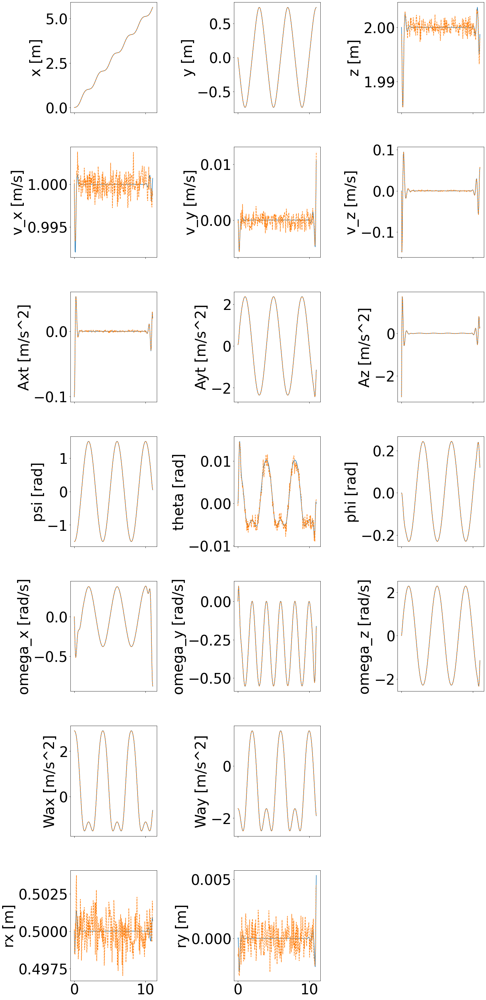

In [630]:
# plot y_sim and y_sim_noise
fig, ax = plt.subplots(7, 3, figsize=(20, 40), sharex=True)
# set test size
mpl.rcParams['font.size'] = 40
ax[0, 0].plot(t_sim, y_sim['x'], label='x')
ax[0, 0].plot(t_sim, y_sim_noise['x'], label='x noise', linestyle='--')
ax[0, 0].set_ylabel('x [m]')
ax[0, 1].plot(t_sim, y_sim['y'], label='y')
ax[0, 1].plot(t_sim, y_sim_noise['y'], label='y noise', linestyle='--')
ax[0, 1].set_ylabel('y [m]')
ax[0, 2].plot(t_sim, y_sim['z'], label='z')
ax[0, 2].plot(t_sim, y_sim_noise['z'], label='z noise', linestyle='--')
ax[0, 2].set_ylabel('z [m]')
ax[1, 0].plot(t_sim, y_sim['v_x'], label='v_x')
ax[1, 0].plot(t_sim, y_sim_noise['v_x'], label='v_x noise', linestyle='--')
ax[1, 0].set_ylabel('v_x [m/s]')
ax[1, 1].plot(t_sim, y_sim['v_y'], label='v_y')
ax[1, 1].plot(t_sim, y_sim_noise['v_y'], label='v_y noise', linestyle='--')
ax[1, 1].set_ylabel('v_y [m/s]')
ax[1, 2].plot(t_sim, y_sim['v_z'], label='v_z')
ax[1, 2].plot(t_sim, y_sim_noise['v_z'], label='v_z noise', linestyle='--')
ax[1, 2].set_ylabel('v_z [m/s]')
ax[2, 0].plot(t_sim, y_sim['Axt'], label='Axt')
ax[2, 0].plot(t_sim, y_sim_noise['Axt'], label='Axt noise', linestyle='--')
ax[2, 0].set_ylabel('Axt [m/s^2]')
ax[2, 1].plot(t_sim, y_sim['Ayt'], label='Ayt')
ax[2, 1].plot(t_sim, y_sim_noise['Ayt'], label='Ayt noise', linestyle='--')
ax[2, 1].set_ylabel('Ayt [m/s^2]')
ax[2, 2].plot(t_sim, y_sim['Az'], label='Az')
ax[2, 2].plot(t_sim, y_sim_noise['Az'], label='Az noise', linestyle='--')
ax[2, 2].set_ylabel('Az [m/s^2]')
ax[3, 0].plot(t_sim, y_sim['psi'], label='psi')
ax[3, 0].plot(t_sim, y_sim_noise['psi'], label='psi noise', linestyle='--')
ax[3, 0].set_ylabel('psi [rad]')
ax[3, 1].plot(t_sim, y_sim['theta'], label='theta')
ax[3, 1].plot(t_sim, y_sim_noise['theta'], label='theta noise', linestyle='--')
ax[3, 1].set_ylabel('theta [rad]')
ax[3, 2].plot(t_sim, y_sim['phi'], label='phi')
ax[3, 2].plot(t_sim, y_sim_noise['phi'], label='phi noise', linestyle='--')
ax[3, 2].set_ylabel('phi [rad]')
ax[4, 0].plot(t_sim, y_sim['omega_x'], label='omega_x')
ax[4, 0].plot(t_sim, y_sim_noise['omega_x'], label='omega_x noise', linestyle='--')
ax[4, 0].set_ylabel('omega_x [rad/s]')
ax[4, 1].plot(t_sim, y_sim['omega_y'], label='omega_y')
ax[4, 1].plot(t_sim, y_sim_noise['omega_y'], label='omega_y noise', linestyle='--')
ax[4, 1].set_ylabel('omega_y [rad/s]')
ax[4, 2].plot(t_sim, y_sim['omega_z'], label='omega_z')
ax[4, 2].plot(t_sim, y_sim_noise['omega_z'], label='omega_z noise', linestyle='--')
ax[4, 2].set_ylabel('omega_z [rad/s]')
ax[5, 0].plot(t_sim, y_sim['Wax'], label='Wax')
ax[5, 0].plot(t_sim, y_sim_noise['Wax'], label='Wax noise', linestyle='--')
ax[5, 0].set_ylabel('Wax [m/s^2]')
ax[5, 1].plot(t_sim, y_sim['Way'], label='Way')
ax[5, 1].plot(t_sim, y_sim_noise['Way'], label='Way noise', linestyle='--')
ax[5, 1].set_ylabel('Way [m/s^2]')
ax[5, 2].set_visible(False)  # Hide the empty subplot
ax[6, 0].plot(t_sim, y_sim['rx'], label='rx')
ax[6, 0].plot(t_sim, y_sim_noise['rx'], label='rx noise', linestyle='--')
ax[6, 0].set_ylabel('rx [m]')
ax[6, 1].plot(t_sim, y_sim['ry'], label='ry')
ax[6, 1].plot(t_sim, y_sim_noise['ry'], label='ry noise', linestyle='--')
ax[6, 1].set_ylabel('ry [m]')
ax[6, 2].set_visible(False)  # Hide the empty subplot

plt.tight_layout()
plt.show()

In [631]:
# g= np.sqrt(y_sim_noise['v_x']**2 + y_sim_noise['v_y']**2)
# beta = np.arctan2(y_sim_noise['v_y'], y_sim_noise['v_x'])
# a= np.sqrt(y_sim_noise['Wax']**2 + y_sim_noise['Way']**2)
# gamma = np.arctan2(y_sim_noise['Way'], y_sim_noise['Wax'])
# psi = y_sim_noise['psi']
# w_true= np.sqrt(x_sim['wx']**2 + x_sim['wy']**2)
# zeta_true = np.arctan2(x_sim['wy'], x_sim['wx'])
# gv= g*np.exp(-1j*beta)
# av= a*np.exp(-1j*gamma)
# wv = av - gv

# w= np.abs(wv)
# zeta = np.angle(wv)+ psi

# print('wind speed error:', np.mean(np.abs(w - w_true)))
# print('wind direction error:', np.mean(np.abs(zeta - zeta_true)))

# plt.plot(t_sim, w_true, label='w_true')
# plt.plot(t_sim, w, label='w')
# plt.xlabel('time [s]')
# plt.ylabel('wind speed [m/s]')
# plt.legend()
# plt.show()
# plt.plot(t_sim, zeta_true, label='zeta_true')
# plt.plot(t_sim, zeta, label='zeta')
# plt.xlabel('time [s]')
# plt.ylabel('wind direction [rad]')
# plt.legend()
# plt.show()

##### cluster the data based on the sensors sweep

In [632]:
P_cluster = np.array(np.vstack([y_sim_noise['x'], y_sim_noise['y'], y_sim_noise['z']]))
V_cluster = np.array(np.vstack([y_sim_noise['v_x'], y_sim_noise['v_y'], y_sim_noise['v_z']]))
Attitude_cluster = np.array(np.vstack([y_sim_noise['phi'], y_sim_noise['theta'], y_sim_noise['psi']]))
Omega_cluster = np.array(np.vstack([y_sim_noise['omega_x'], y_sim_noise['omega_y'], y_sim_noise['omega_z']]))
Acc_cluster = np.array(np.vstack([y_sim_noise['Axt'], y_sim_noise['Ayt'], y_sim_noise['Az']]))
IMU_cluster = np.array(np.vstack([y_sim_noise['phi'], y_sim_noise['theta'], y_sim_noise['psi'], y_sim_noise['omega_x'], y_sim_noise['omega_y'], y_sim_noise['omega_z'], y_sim_noise['Axt'], y_sim_noise['Ayt'], y_sim_noise['Az']]))
Wind_cluster = np.array(np.vstack([y_sim_noise['Wax'], y_sim_noise['Way']]))
OF_cluster = np.array(np.vstack([y_sim_noise['rx'], y_sim_noise['ry']]))
if Y_SWEEP == 'ALL':
    print('Running all sensors...')
    Y_noise = {}
    for sensor in SENSORS:
        if sensor == 'IMU':
            Y_noise[sensor] = np.vstack((IMU_cluster))
        elif sensor == 'IMU + OPTIC_FLOW':
            Y_noise[sensor] = np.vstack((IMU_cluster, OF_cluster))
        elif sensor == 'IMU + WIND':
            Y_noise[sensor] = np.vstack((IMU_cluster, Wind_cluster))
        elif sensor == 'IMU + WIND + OPTIC_FLOW':
            Y_noise[sensor] = np.vstack((IMU_cluster, OF_cluster, Wind_cluster))
        elif sensor == 'IMU + VEL + WIND':
            Y_noise[sensor] = np.vstack((IMU_cluster, V_cluster, Wind_cluster))
        else:
            raise ValueError('Invalid sensor type')
    print(f'Running sensors: {list(Y_noise.keys())}')
else:
    print(f'Running sensors: {Y_SWEEP}')
    if Y_SWEEP == 'IMU':
        Y_noise = np.vstack((IMU_cluster))
    elif Y_SWEEP == 'IMU + OPTIC_FLOW':
        Y_noise = np.vstack((IMU_cluster, OF_cluster))
    elif Y_SWEEP == 'IMU + WIND':
        Y_noise = np.vstack((IMU_cluster, Wind_cluster))
    elif Y_SWEEP == 'IMU + WIND + OPTIC_FLOW':
        Y_noise = np.vstack((IMU_cluster, OF_cluster, Wind_cluster))
    elif Y_SWEEP == 'IMU + VEL + WIND':
        Y_noise = np.vstack((IMU_cluster, V_cluster, Wind_cluster))
    else:
        raise ValueError('Invalid Y_SWEEP value')

Running all sensors...
Running sensors: ['IMU', 'IMU + OPTIC_FLOW', 'IMU + WIND', 'IMU + WIND + OPTIC_FLOW']


### get the control inputs U

In [633]:
U = np.array(np.vstack([u_sim['PWM1'], u_sim['PWM2'], u_sim['PWM3'], u_sim['PWM4']]))

### get the initial condition and add some offset to them

In [634]:
x0_x_offset = 1.0
x0_y_offset = 1.0
x0_z_offset = 1.0
x0_v_x_offset = 1.0
x0_v_y_offset = 1.0
x0_v_z_offset = 1.0
x0_psi_offset = 1.0
x0_theta_offset = 1.0
x0_phi_offset = 1.0
x0_omega_x_offset = 1.0
x0_omega_y_offset = 1.0
x0_omega_z_offset = 1.0
x0_wx_offset = 1.0
x0_wy_offset = 1.0

Xo= np.atleast_2d(np.vstack((
    X0_sim[0] + x0_x_offset,X0_sim[1] + x0_y_offset,X0_sim[2] + x0_z_offset,
    X0_sim[3] + x0_v_x_offset,X0_sim[4] + x0_v_y_offset,X0_sim[5] + x0_v_z_offset,
    X0_sim[6] + x0_phi_offset,X0_sim[7] + x0_theta_offset,X0_sim[8] + x0_psi_offset,
    X0_sim[9] + x0_omega_x_offset,X0_sim[10] + x0_omega_y_offset,X0_sim[11] + x0_omega_z_offset,
    X0_sim[12] + x0_wx_offset,X0_sim[13] + x0_wy_offset
)))



### System Covariance Q

In [635]:
Q = np.diag(np.array([
    1e-20, 1e-20, 1e-20,  # x, y, z
    1e-20, 1e-20, 1e-20,  # v_x, v_y, v_z
    1e-20, 1e-20, 1e-20,  # phi, theta, psi
    1e-20, 1e-20, 1e-20,  # omega_x, omega_y, omega_z
    1e-20, 1e-20        # wx, wy
]))

### Error covariance R

In [636]:
if Y_SWEEP == 'ALL':
    R={}
    for sensor in SENSORS:
        if sensor == 'IMU':
            R[sensor] = np.power(np.diag(np.array([
                attitude_noise_std, attitude_noise_std, attitude_noise_std,  # phi, theta, psi
                omega_noise_std, omega_noise_std, omega_noise_std,  # omega_x, omega_y, omega_z
                acc_noise_std, acc_noise_std, acc_noise_std  # Ax, Ay, Az
            ])), 2)
        elif sensor == 'IMU + OPTIC_FLOW':
            R[sensor] = np.power(np.diag(np.array([
                attitude_noise_std, attitude_noise_std, attitude_noise_std,  # phi, theta, psi
                omega_noise_std, omega_noise_std, omega_noise_std,  # omega_x, omega_y, omega_z
                acc_noise_std, acc_noise_std, acc_noise_std,  # Ax, Ay, Az
                of_noise_std, of_noise_std  # rx, ry
            ])), 2)
        elif sensor == 'IMU + WIND':
            R[sensor] = np.power(np.diag(np.array([
                attitude_noise_std, attitude_noise_std, attitude_noise_std,  # phi, theta, psi
                omega_noise_std, omega_noise_std, omega_noise_std,  # omega_x, omega_y, omega_z
                acc_noise_std, acc_noise_std, acc_noise_std,  # Ax, Ay, Az
                wind_noise_std, wind_noise_std  # Wax, Way
            ])), 2)
        elif sensor == 'IMU + WIND + OPTIC_FLOW':
            R[sensor] = np.power(np.diag(np.array([
                attitude_noise_std, attitude_noise_std, attitude_noise_std,
                omega_noise_std, omega_noise_std, omega_noise_std,
                acc_noise_std, acc_noise_std, acc_noise_std,
                of_noise_std, of_noise_std,
                wind_noise_std, wind_noise_std
            ])), 2)
        elif sensor == 'IMU + VEL + WIND':
            R[sensor] = np.power(np.diag(np.array([
                attitude_noise_std, attitude_noise_std, attitude_noise_std,  # phi, theta, psi
                omega_noise_std, omega_noise_std, omega_noise_std,  # omega_x, omega_y, omega_z
                acc_noise_std, acc_noise_std, acc_noise_std,  # Ax, Ay, Az
                velocity_noise_std, velocity_noise_std, velocity_noise_std,  # v_x, v_y, v_z
                wind_noise_std, wind_noise_std  # Wax, Way
            ])), 2)

elif Y_SWEEP == 'IMU':
    R = np.power(np.diag(np.array([
        attitude_noise_std, attitude_noise_std, attitude_noise_std,  # phi, theta, psi
        omega_noise_std, omega_noise_std, omega_noise_std,  # omega_x, omega_y, omega_z
        acc_noise_std, acc_noise_std, acc_noise_std,  # Ax, Ay, Az
    ])), 2)
elif Y_SWEEP == 'IMU + OPTIC_FLOW':
    R = np.power(np.diag(np.array([
        attitude_noise_std, attitude_noise_std, attitude_noise_std,  # phi, theta, psi
        omega_noise_std, omega_noise_std, omega_noise_std,  # omega_x, omega_y, omega_z
        acc_noise_std, acc_noise_std, acc_noise_std,  # Ax, Ay, Az
        of_noise_std, of_noise_std  # rx, ry
    ])), 2)
elif Y_SWEEP == 'IMU + WIND':
    R = np.power(np.diag(np.array([
        attitude_noise_std, attitude_noise_std, attitude_noise_std,  # phi, theta, psi
        omega_noise_std, omega_noise_std, omega_noise_std,  # omega_x, omega_y, omega_z
        acc_noise_std, acc_noise_std, acc_noise_std,  # Ax, Ay, Az
        wind_noise_std, wind_noise_std  # Wax, Way
    ])), 2)
elif Y_SWEEP == 'IMU + WIND + OPTIC_FLOW':
    R = np.power(np.diag(np.array([
        attitude_noise_std, attitude_noise_std, attitude_noise_std,  # phi, theta, psi
        omega_noise_std, omega_noise_std, omega_noise_std,  # omega_x, omega_y, omega_z
        acc_noise_std, acc_noise_std, acc_noise_std,  # Ax, Ay, Az
        of_noise_std, of_noise_std,  # rx, ry
        wind_noise_std, wind_noise_std  # Wax, Way
    ])), 2)
elif Y_SWEEP == 'IMU + VEL + WIND':
    R = np.power(np.diag(np.array([
        attitude_noise_std, attitude_noise_std, attitude_noise_std,  # phi, theta, psi
        omega_noise_std, omega_noise_std, omega_noise_std,  # omega_x, omega_y, omega_z
        acc_noise_std, acc_noise_std, acc_noise_std,  # Ax, Ay, Az
        velocity_noise_std, velocity_noise_std, velocity_noise_std,  # v_x, v_y, v_z
        wind_noise_std, wind_noise_std  # Wax, Way
    ])), 2)


### Initial estimate covariance $P_{o}$

In [637]:
P0 = np.diag(np.array([x0_x_offset, x0_y_offset, x0_z_offset,
                       x0_v_x_offset, x0_v_y_offset, x0_v_z_offset,
                       x0_psi_offset, x0_theta_offset, x0_phi_offset,
                       x0_omega_x_offset, x0_omega_y_offset, x0_omega_z_offset,
                       x0_wx_offset, x0_wy_offset]) ** 2)
P0

array([[1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.]])

### check that the size of inputs are correct

In [638]:
if Y_SWEEP == 'ALL':
    for sensor in SENSORS:
        if Y_noise[sensor].shape[0] != R[sensor].shape[0]:
            raise ValueError(f'Y_noise[{sensor}] and R[{sensor}] must have the same number of rows')
        elif Y_noise[sensor].shape[0] != R[sensor].shape[1]:
            raise ValueError(f'Y_noise[{sensor}] and R[{sensor}] must have the same number of columns')
        elif Xo.shape[0] != P0.shape[0]:
            raise ValueError(f'Xo and P0 must have the same number of rows for {sensor}')
        elif Xo.shape[0] != P0.shape[1]:
            raise ValueError(f'Xo and P0 must have the same number of columns for {sensor}')
        elif Xo.shape[0] != Q.shape[0]:
            raise ValueError(f'Xo and Q must have the same number of rows for {sensor}')
        elif Xo.shape[0] != Q.shape[1]:
            raise ValueError(f'Xo and Q must have the same number of columns for {sensor}')
        else:
            print(f'All dimensions are correct for {sensor}')
        print('Y_noise shape:', Y_noise[sensor].shape)
        print('U shape:', U.shape)
        print('R shape:', R[sensor].shape)
        print('Xo shape:', Xo.shape)
        print('P0 shape:', P0.shape)
        print('Q shape:', Q.shape)

else:
    if Y_noise.shape[0] != R.shape[0]:
        raise ValueError('Y_noise and R must have the same number of rows')
    elif Y_noise.shape[0] != R.shape[1]:
        raise ValueError('Y_noise and R must have the same number of columns')
    elif Xo.shape[0] != P0.shape[0]:
        raise ValueError('Xo and P0 must have the same number of rows')
    elif Xo.shape[0] != P0.shape[1]:
        raise ValueError('Xo and P0 must have the same number of columns')
    elif Xo.shape[0] != Q.shape[0]:
        raise ValueError('Xo and Q must have the same number of rows')
    elif Xo.shape[0] != Q.shape[1]:
        raise ValueError('Xo and Q must have the same number of columns')
    else:
        print('All dimensions are correct for just {Y_SWEEP}')

    print('Y_noise shape:', Y_noise.shape)
    print('U shape:', U.shape)
    print('R shape:', R.shape)
    print('Xo shape:', Xo.shape)
    print('P0 shape:', P0.shape)
    print('Q shape:', Q.shape)

All dimensions are correct for IMU
Y_noise shape: (9, 221)
U shape: (4, 221)
R shape: (9, 9)
Xo shape: (14, 1)
P0 shape: (14, 14)
Q shape: (14, 14)
All dimensions are correct for IMU + OPTIC_FLOW
Y_noise shape: (11, 221)
U shape: (4, 221)
R shape: (11, 11)
Xo shape: (14, 1)
P0 shape: (14, 14)
Q shape: (14, 14)
All dimensions are correct for IMU + WIND
Y_noise shape: (11, 221)
U shape: (4, 221)
R shape: (11, 11)
Xo shape: (14, 1)
P0 shape: (14, 14)
Q shape: (14, 14)
All dimensions are correct for IMU + WIND + OPTIC_FLOW
Y_noise shape: (13, 221)
U shape: (4, 221)
R shape: (13, 13)
Xo shape: (14, 1)
P0 shape: (14, 14)
Q shape: (14, 14)


# Run the EKF

In [639]:
E_FLAG = 'EKF'
if Y_SWEEP == 'ALL':
    xhat = {}
    P = {}
    S = {}
    for sensor in SENSORS:
        print(f'Running EKF for sensor: {sensor}')
        tst = time.time()
        if E_FLAG == 'EKF':
            xhat[sensor], P[sensor], S[sensor] = EKF(Y_noise[sensor], Xo, f_c, h_c[sensor], Q, R[sensor], U, P0)
        elif E_FLAG == 'UKF':
            N= Y_noise[sensor].shape[0]
            Q_3d = np.tile(np.expand_dims(Q, 2), N)
            R_3d = np.tile(np.expand_dims(R[sensor], 2), N)
            xhat[sensor], P[sensor], S[sensor] = ukf_sqrt(Y_noise[sensor], Xo, f_c_ukf, h_c_ukf[sensor], Q_3d, R_3d, U)

        print(f'Finished EKF for sensor: {sensor}')
        tet = time.time()
        print('elapsed time:', tet-tst)

else:
    xhat, P, S = EKF(Y_noise, Xo, f_c, h_c, Q, R, U, P0)

Running EKF for sensor: IMU
Finished EKF for sensor: IMU
elapsed time: 55.80724573135376
Running EKF for sensor: IMU + OPTIC_FLOW
Finished EKF for sensor: IMU + OPTIC_FLOW
elapsed time: 54.98462247848511
Running EKF for sensor: IMU + WIND
Finished EKF for sensor: IMU + WIND
elapsed time: 55.18029594421387
Running EKF for sensor: IMU + WIND + OPTIC_FLOW
Finished EKF for sensor: IMU + WIND + OPTIC_FLOW
elapsed time: 56.41463780403137


In [640]:
# creat dictionary from xhat
if Y_SWEEP == 'ALL':
    print('Creating xhat_dict for all sensors...')
    xhat_dict = {}
    for sensor in SENSORS:
        xhat_dict[sensor] = {
            'x_hat': xhat[sensor][0, :],
            'y_hat': xhat[sensor][1, :],
            'z_hat': xhat[sensor][2, :],
            'v_x_hat': xhat[sensor][3, :],
            'v_y_hat': xhat[sensor][4, :],
            'v_z_hat': xhat[sensor][5, :],
            'phi_hat': xhat[sensor][6, :],
            'theta_hat': xhat[sensor][7, :],
            'psi_hat': xhat[sensor][8, :],
            'omega_x_hat': xhat[sensor][9, :],
            'omega_y_hat': xhat[sensor][10, :],
            'omega_z_hat': xhat[sensor][11, :],
            'wx_hat': xhat[sensor][12, :],
            'wy_hat': xhat[sensor][13, :],
            'g_hat': (xhat[sensor][3, :]**2 + xhat[sensor][4, :]**2)**0.5,
            'beta_hat': np.arctan2(xhat[sensor][4, :], xhat[sensor][3, :]),
            'W_hat':(xhat[sensor][12, :]**2 + xhat[sensor][13, :]**2)**0.5,
            'zeta_hat': np.arctan2(xhat[sensor][13, :], xhat[sensor][12, :]),
        }
else:

    xhat_dict = {
        'x_hat': xhat[0, :],
        'y_hat': xhat[1, :],
        'z_hat': xhat[2, :],
        'v_x_hat': xhat[3, :],
        'v_y_hat': xhat[4, :],
        'v_z_hat': xhat[5, :],
        'phi_hat': xhat[6, :],
        'theta_hat': xhat[7, :],
        'psi_hat': xhat[8, :],
        'omega_x_hat': xhat[9, :],
        'omega_y_hat': xhat[10, :],
        'omega_z_hat': xhat[11, :],
        'wx_hat': xhat[12, :],
        'wy_hat': xhat[13, :],
        'g_hat': (xhat[3, :]**2 + xhat[4, :]**2)**0.5,
        'beta_hat': np.arctan2(xhat[4, :], xhat[3, :]),
        'W_hat':(xhat[12, :]**2 + xhat[13, :]**2)**0.5,
        'zeta_hat': np.arctan2(xhat[13, :], xhat[12, :]),
}

Creating xhat_dict for all sensors...


# Plotting the results

Plotting results for all sensors...


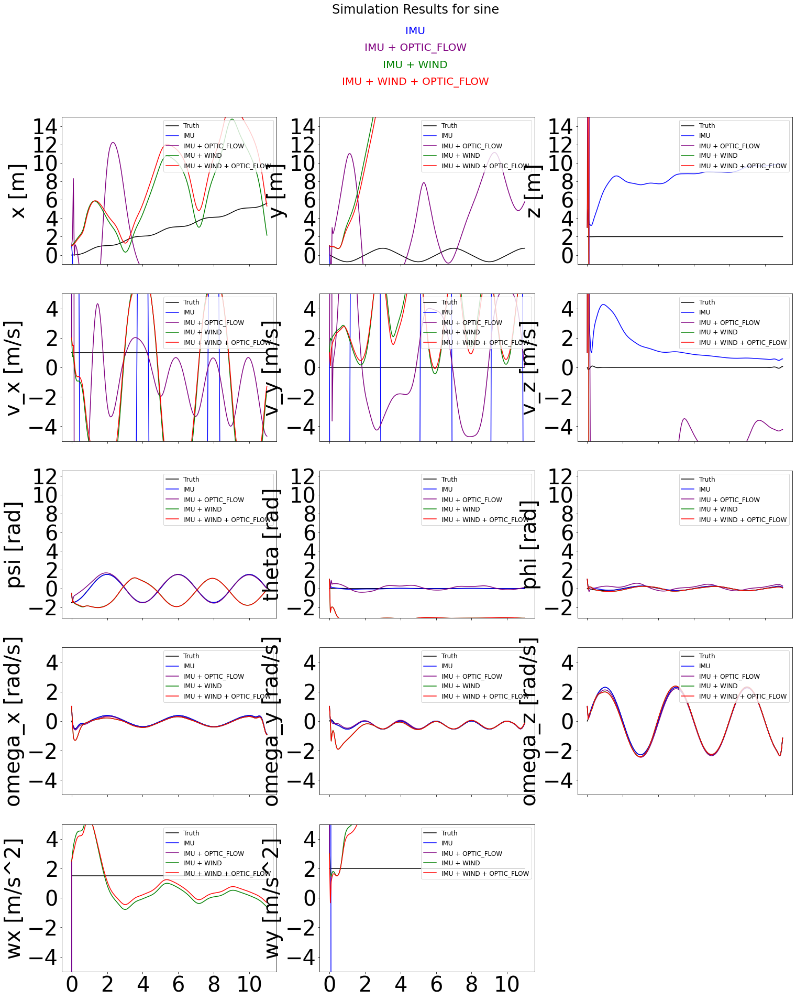

In [641]:
# creat a list of colors for each sensor combination
colors = {}
for sensor in SENSORS:
    if sensor == 'IMU':
        colors[sensor] = 'blue'
    elif sensor == 'IMU + OPTIC_FLOW':
        colors[sensor] = 'purple'
    elif sensor == 'IMU + WIND':
        colors[sensor] = 'green'
    elif sensor == 'IMU + WIND + OPTIC_FLOW':
        colors[sensor] = 'red'
    elif sensor == 'IMU + VEL + WIND':
        colors[sensor] = 'orange'
    else:
        raise ValueError('Invalid sensor type')
if Y_SWEEP == 'ALL':
    print('Plotting results for all sensors...')
    fig, ax = plt.subplots(5, 3, figsize=(25, 30), sharex=True)
    # set text size
    mpl.rcParams['font.size'] = 10
    # add figure title
    fig.suptitle(f'Simulation Results for {motif_type}', fontsize=24)

    # Add colored sensor names at the top, each on a new line
    sensor_labels = [
        ('IMU', colors['IMU']),
        ('IMU + OPTIC_FLOW', colors['IMU + OPTIC_FLOW']),
        ('IMU + WIND', colors['IMU + WIND']),
        ('IMU + WIND + OPTIC_FLOW', colors['IMU + WIND + OPTIC_FLOW'])
    ]
    for i, (label, color) in enumerate(sensor_labels):
        fig.text(
            0.5, 0.96 - i*0.015,  # y-position decreases for each sensor
            label,
            ha='center', va='top',
            fontsize=20,
            color=color
        )


    ax[0, 0].plot(t_sim, x_sim['x'], label='x',color = 'k')
    ax[0, 1].plot(t_sim, x_sim['y'], label='y',color = 'k')
    ax[0, 2].plot(t_sim, x_sim['z'], label='z',color = 'k')
    ax[1, 0].plot(t_sim, x_sim['v_x'], label='v_x',color = 'k')
    ax[1, 1].plot(t_sim, x_sim['v_y'], label='v_y',color = 'k')
    ax[1, 2].plot(t_sim, x_sim['v_z'], label='v_z',color = 'k')
    ax[2, 0].plot(t_sim, x_sim['psi'], label='psi',color = 'k')
    ax[2, 1].plot(t_sim, x_sim['theta'], label='theta',color = 'k')
    ax[2, 2].plot(t_sim, x_sim['phi'], label='phi',color = 'k')
    ax[3, 0].plot(t_sim, x_sim['omega_x'], label='omega_x',color = 'k')
    ax[3, 1].plot(t_sim, x_sim['omega_y'], label='omega_y',color = 'k')
    ax[3, 2].plot(t_sim, x_sim['omega_z'], label='omega_z',color = 'k')
    ax[4, 0].plot(t_sim, x_sim['wx'], label='wx',color = 'k')
    ax[4, 1].plot(t_sim, x_sim['wy'], label='wy',color = 'k')
    # add truth to SENSORS at the start call it LEGENDS
    LEGENDS = ['Truth']+SENSORS
    for sensor in SENSORS:
        ax[0, 0].plot(t_sim, xhat_dict[sensor]['x_hat'], label='x_hat', color=colors[sensor])
        ax[0, 0].set_ylabel('x [m]')
        ax[0, 0].set_ylim([-1, 15])
        ax[0, 0].legend(LEGENDS, loc='upper right', fontsize=12)
        ax[0, 1].plot(t_sim, xhat_dict[sensor]['y_hat'], label='y_hat', color=colors[sensor])
        ax[0, 1].set_ylabel('y [m]')
        ax[0, 1].set_ylim([-1, 15])
        ax[0, 1].legend(LEGENDS, loc='upper right', fontsize=12)
        ax[0, 2].plot(t_sim, xhat_dict[sensor]['z_hat'], label='z_hat', color=colors[sensor])
        ax[0, 2].set_ylabel('z [m]')
        ax[0, 2].set_ylim([-1, 15])
        ax[0, 2].legend(LEGENDS, loc='upper right', fontsize=12)
        ax[1, 0].plot(t_sim, xhat_dict[sensor]['v_x_hat'], label='v_x_hat', color=colors[sensor])
        ax[1, 0].set_ylabel('v_x [m/s]')
        ax[1, 0].set_ylim([-5, 5])
        ax[1, 0].legend(LEGENDS, loc='upper right', fontsize=12)
        ax[1, 1].plot(t_sim, xhat_dict[sensor]['v_y_hat'], label='v_y_hat', color=colors[sensor])
        ax[1, 1].set_ylabel('v_y [m/s]')
        ax[1, 1].set_ylim([-5, 5])
        ax[1, 1].legend(LEGENDS, loc='upper right', fontsize=12)
        ax[1, 2].plot(t_sim, xhat_dict[sensor]['v_z_hat'], label='v_z_hat', color=colors[sensor])
        ax[1, 2].set_ylabel('v_z [m/s]')
        ax[1, 2].set_ylim([-5, 5])
        ax[1, 2].legend(LEGENDS, loc='upper right', fontsize=12)
        ax[2, 0].plot(t_sim, xhat_dict[sensor]['psi_hat'], label='psi_hat', color=colors[sensor])
        ax[2, 0].set_ylabel('psi [rad]')
        ax[2, 0].set_ylim([-1*np.pi, 4*np.pi])
        ax[2, 0].legend(LEGENDS, loc='upper right', fontsize=12)
        ax[2, 1].plot(t_sim, xhat_dict[sensor]['theta_hat'], label='theta_hat', color=colors[sensor])
        ax[2, 1].set_ylabel('theta [rad]')
        ax[2, 1].set_ylim([-1*np.pi, 4*np.pi])
        ax[2, 1].legend(LEGENDS, loc='upper right', fontsize=12)
        ax[2, 2].plot(t_sim, xhat_dict[sensor]['phi_hat'], label='phi_hat', color=colors[sensor])
        ax[2, 2].set_ylabel('phi [rad]')
        ax[2, 2].set_ylim([-1*np.pi, 4*np.pi])
        ax[2, 2].legend(LEGENDS, loc='upper right', fontsize=12)
        ax[3, 0].plot(t_sim, xhat_dict[sensor]['omega_x_hat'], label='omega_x_hat', color=colors[sensor])
        ax[3, 0].set_ylabel('omega_x [rad/s]')
        ax[3, 0].set_ylim([-5, 5])
        ax[3, 0].legend(LEGENDS, loc='upper right', fontsize=12)
        ax[3, 1].plot(t_sim, xhat_dict[sensor]['omega_y_hat'], label='omega_y_hat', color=colors[sensor])
        ax[3, 1].set_ylabel('omega_y [rad/s]')
        ax[3, 1].set_ylim([-5, 5])
        ax[3, 1].legend(LEGENDS, loc='upper right', fontsize=12)
        ax[3, 2].plot(t_sim, xhat_dict[sensor]['omega_z_hat'], label='omega_z_hat', color=colors[sensor])
        ax[3, 2].set_ylabel('omega_z [rad/s]')
        ax[3, 2].set_ylim([-5, 5])
        ax[3, 2].legend(LEGENDS, loc='upper right', fontsize=12)
        ax[4, 0].plot(t_sim, xhat_dict[sensor]['wx_hat'], label='wx_hat', color=colors[sensor])
        ax[4, 0].set_ylabel('wx [m/s^2]')
        ax[4, 0].set_ylim([-5, 5])
        ax[4, 0].legend(LEGENDS, loc='upper right', fontsize=12)
        ax[4, 1].plot(t_sim, xhat_dict[sensor]['wy_hat'], label='wy_hat', color=colors[sensor])
        ax[4, 1].set_ylabel('wy [m/s^2]')
        ax[4, 1].set_ylim([-5, 5])
        ax[4, 1].legend(LEGENDS, loc='upper right', fontsize=12)
        ax[4, 2].set_visible(False)   
    # plt.tight_layout()
    plt.show()

else:
    fig, ax = plt.subplots(5, 3, figsize=(25, 30), sharex=True)
    # set text size
    mpl.rcParams['font.size'] = 18
    ax[0, 0].plot(t_sim, x_sim['x'], label='x',color = 'k')
    ax[0, 0].plot(t_sim, xhat_dict['x_hat'], label='x_hat', color = 'blue')
    ax[0, 0].set_ylabel('x [m]')
    ax[0, 0].set_ylim([-1, 15])
    ax[0, 1].plot(t_sim, x_sim['y'], label='y',color = 'k')
    ax[0, 1].plot(t_sim, xhat_dict['y_hat'], label='y_hat', color = 'blue')
    ax[0, 1].set_ylabel('y [m]')
    ax[0, 1].set_ylim([-1, 15])
    ax[0, 2].plot(t_sim, x_sim['z'], label='z',color = 'k')
    ax[0, 2].plot(t_sim, xhat_dict['z_hat'], label='z_hat', color = 'blue')
    ax[0, 2].set_ylabel('z [m]')
    ax[0, 2].set_ylim([-1, 15])
    ax[1, 0].plot(t_sim, x_sim['v_x'], label='v_x',color = 'k')
    ax[1, 0].plot(t_sim, xhat_dict['v_x_hat'], label='v_x_hat', color = 'blue')
    ax[1, 0].set_ylabel('v_x [m/s]')
    ax[1, 0].set_ylim([-5, 5])
    ax[1, 1].plot(t_sim, x_sim['v_y'], label='v_y',color = 'k')
    ax[1, 1].plot(t_sim, xhat_dict['v_y_hat'], label='v_y_hat', color = 'blue')
    ax[1, 1].set_ylabel('v_y [m/s]')
    ax[1, 1].set_ylim([-5, 5])
    ax[1, 2].plot(t_sim, x_sim['v_z'], label='v_z',color = 'k')
    ax[1, 2].plot(t_sim, xhat_dict['v_z_hat'], label='v_z_hat', color = 'blue')
    ax[1, 2].set_ylabel('v_z [m/s]')
    ax[1, 2].set_ylim([-5, 5])
    ax[2, 0].plot(t_sim, x_sim['psi'], label='psi',color = 'k')
    ax[2, 0].plot(t_sim, xhat_dict['psi_hat'], label='psi_hat', color = 'blue')
    ax[2, 0].set_ylabel('psi [rad]')
    ax[2, 0].set_ylim([-1*np.pi, 4*np.pi])
    ax[2, 1].plot(t_sim, x_sim['theta'], label='theta',color = 'k')
    ax[2, 1].plot(t_sim, xhat_dict['theta_hat'], label='theta_hat', color = 'blue')
    ax[2, 1].set_ylabel('theta [rad]')
    ax[2, 1].set_ylim([-1*np.pi, 4*np.pi])
    ax[2, 2].plot(t_sim, x_sim['phi'], label='phi',color = 'k')
    ax[2, 2].plot(t_sim, xhat_dict['phi_hat'], label='phi_hat', color = 'blue')
    ax[2, 2].set_ylabel('phi [rad]')
    ax[2, 2].set_ylim([-1*np.pi, 4*np.pi])
    ax[3, 0].plot(t_sim, x_sim['omega_x'], label='omega_x',color = 'k')
    ax[3, 0].plot(t_sim, xhat_dict['omega_x_hat'], label='omega_x_hat', color = 'blue')
    ax[3, 0].set_ylabel('omega_x [rad/s]')
    ax[3, 0].set_ylim([-5, 5])
    ax[3, 1].plot(t_sim, x_sim['omega_y'], label='omega_y',color = 'k')
    ax[3, 1].plot(t_sim, xhat_dict['omega_y_hat'], label='omega_y_hat', color = 'blue')
    ax[3, 1].set_ylabel('omega_y [rad/s]')
    ax[3, 1].set_ylim([-5, 5])
    ax[3, 2].plot(t_sim, x_sim['omega_z'], label='omega_z',color = 'k')
    ax[3, 2].plot(t_sim, xhat_dict['omega_z_hat'], label='omega_z_hat', color = 'blue')
    ax[3, 2].set_ylabel('omega_z [rad/s]')
    ax[3, 2].set_ylim([-5, 5])
    ax[4, 0].plot(t_sim, x_sim['wx'], label='wx',color = 'k')
    ax[4, 0].plot(t_sim, xhat_dict['wx_hat'], label='wx_hat', color = 'blue')
    ax[4, 0].set_ylabel('wx [m/s]')
    ax[4, 0].set_ylim([-5, 5])
    ax[4, 1].plot(t_sim, x_sim['wy'], label='wy',color = 'k')
    ax[4, 1].plot(t_sim, xhat_dict['wy_hat'], label='wy_hat', color = 'blue')
    ax[4, 1].set_ylabel('wy [m/s]')
    ax[4, 1].set_ylim([-5, 5])
    ax[4, 2].set_visible(False)  # Hide the empty subplot
    plt.xlabel('Time [s]')
    plt.title('EKF Results for trajectory type: ' + motif_type)
    plt.tight_layout()
    plt.show()

# Plotting in inkskape

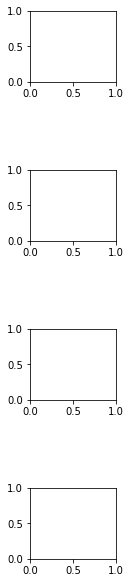

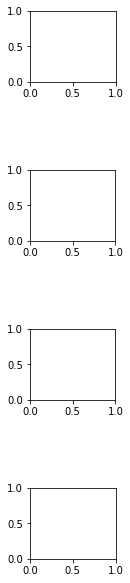

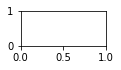

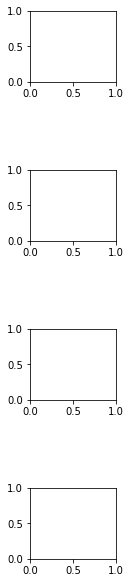

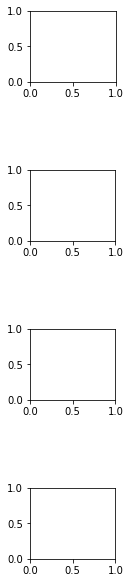

...

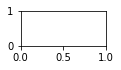

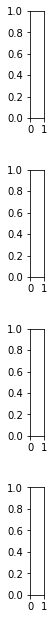

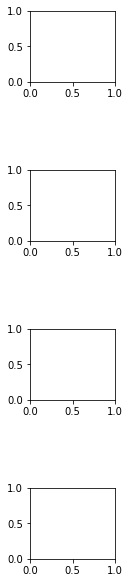

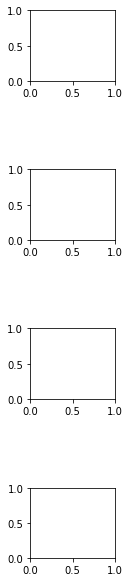

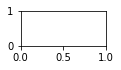

In [514]:
input_svg = '/home/austinlopez/Drone_AFRL/paper_figures/Fig_2_02.svg'
layout = fifi.svg_to_axes.FigureLayout(input_svg, autogenlayers=True, make_mplfigures=True, hide_layers=[])

In [515]:
Flag=False
if Flag:
    # Create a new figure
    fig = plt.figure(figsize=(2, 2))

    # Add an axes to the figure
    ax = fig.add_subplot(111)
else:
    if motif_type == 'constant_velocity':
        ax = layout.axes[('con_vel_traj', 'A')]
    elif motif_type == 'constant_velocity_yaw':
        ax = layout.axes[('con_vel_con_yaw_traj', 'A')]
    elif motif_type == 'constant_accel':
        ax = layout.axes[('con_acc_traj', 'A')]
    elif motif_type == 'sine':
        ax = layout.axes[('sine_traj', 'A')]
    elif motif_type == 'sine_constant_heading':
        ax = layout.axes[('sine_con_head_traj', 'A')]

# ax.plot(x_sim['x'], x_sim['y'], '-k')
# ax.set_xlabel('X (m)'); ax.set_ylabel('Y (m)')
ax.set_title(f"Trajectory: {motif_type}")

# Set up colormap
cmap = plt.get_cmap('viridis')
norm = mpl.colors.Normalize(vmin=tsim[0], vmax=tsim[-1])
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

# overlay triangles with color by time
tri = np.array([[.1,0],[-.05,-.05],[-.05,.05]]) * 2.0
for i in range(0, len(tsim), 5):
    R = np.array([[np.cos(x_sim['psi'][i]), -np.sin(x_sim['psi'][i])],
                [np.sin(x_sim['psi'][i]),  np.cos(x_sim['psi'][i])]])
    tri_r = tri @ R.T
    color = cmap(norm(tsim[i]))
    ax.fill(x_sim['x'][i]+tri_r[:,0],
            x_sim['y'][i]+tri_r[:,1],
            color=color, alpha=0.8, edgecolor=None)
fifi.mpl_functions.adjust_spines(ax, [], yticks=[-2, 0, 2], xticks=[0, 2, 4, 6, 8, 10, 12],
                                      tick_length=3, linewidth=1, spine_locations={'left': 5, 'bottom': 5})
fifi.mpl_functions.set_fontsize(ax, 6)
if motif_type == 'sine':
     ax.set_xlim([-3, 9])
else:
    ax.set_xlim([0, 12])
ax.set_ylim([-2, 2])
ax.set_yticklabels([-2, 0, 2])
ax.set_xticklabels([0, 2, 4, 6, 8, 10, 12])

if Flag:
        plt.show()
        fig.savefig(f'{motif_type}_.pdf', dpi=300)

In [516]:
if motif_type == 'constant_velocity':
    layout.append_figure_to_layer(layout.figures['con_vel_traj'], 'con_vel_traj', cleartarget=True)
elif motif_type == 'constant_velocity_yaw':
    layout.append_figure_to_layer(layout.figures['con_vel_con_yaw_traj'], 'con_vel_con_yaw_traj', cleartarget=True)
elif motif_type == 'constant_accel':
    layout.append_figure_to_layer(layout.figures['con_acc_traj'], 'con_acc_traj', cleartarget=True)
elif motif_type == 'sine':
    layout.append_figure_to_layer(layout.figures['sine_traj'], 'sine_traj', cleartarget=True)
elif motif_type == 'sine_constant_heading':
    layout.append_figure_to_layer(layout.figures['sine_con_head_traj'], 'sine_con_head_traj', cleartarget=True)
layout.write_svg(input_svg)
display(SVG(input_svg))

In [517]:
Flag=False
if Flag:
    # Create a new figure
    fig = plt.figure(figsize=(2, 2))

    # Add an axes to the figure
    ax = fig.add_subplot(111)
else:
    if motif_type == 'constant_velocity':
        ax = layout.axes[('con_vel', 'A')]
    elif motif_type == 'constant_velocity_yaw':
        ax = layout.axes[('con_vel_con_yaw', 'A')]
    elif motif_type == 'constant_accel':
        ax = layout.axes[('con_acc', 'A')]
    elif motif_type == 'sine':
        ax = layout.axes[('sine', 'A')]
    elif motif_type == 'sine_constant_heading':
        ax = layout.axes[('sine_con_head', 'A')]

STATE_A = 'g'

if Y_SWEEP == 'ALL':
    print('Plotting results for all sensors...')
    # Add colored sensor names at the top, each on a new line
    sensor_labels = [
        ('IMU', colors['IMU']),
        ('IMU + OPTIC_FLOW', colors['IMU + OPTIC_FLOW']),
        ('IMU + WIND', colors['IMU + WIND']),
        ('IMU + WIND + OPTIC_FLOW', colors['IMU + WIND + OPTIC_FLOW'])
    ]

    if STATE_A == 'g':
        x_sim_g = np.sqrt(x_sim['v_x']**2 + x_sim['v_y']**2)
        ax.plot(t_sim, x_sim_g, label=STATE_A, color='k')
    elif STATE_A == 'beta':
        x_sim_b = np.arctan2(x_sim['v_y'], x_sim['v_x'])
        ax.plot(t_sim, x_sim_b, label=STATE_A, color='k')
    elif STATE_A == 'W':
        x_sim_W = np.sqrt(x_sim['wx']**2 + x_sim['wy']**2)
        ax.plot(t_sim, x_sim_W, label=STATE_A, color='k')
    elif STATE_A == 'zeta':
        x_sim_z = np.arctan2(x_sim['wy'], x_sim['wx'])
        ax.plot(t_sim, x_sim_z, label=STATE_A, color='k')
    else:
        ax.plot(t_sim, x_sim[STATE_A], label=STATE_A, color='k')
    # add truth to SENSORS at the start call it LEGENDS
    LEGENDS = ['Truth'] + SENSORS
    for sensor in SENSORS:
        ax.plot(t_sim, xhat_dict[sensor][f'{STATE_A}_hat'], label=f'{STATE_A}_hat', color=colors[sensor])
    ax.set_ylabel(f'{STATE_A} [m/s]')
    ax.set_ylim([0, 10])

    fifi.mpl_functions.adjust_spines(ax, ['left'], yticks=[0, 5, 10], xticks=[0, 2, 4, 6, 8, 10, 12],
                                      tick_length=3, linewidth=1, spine_locations={'left': 5, 'bottom': 5})
    ax.set_yticklabels([0, 5, 10])
    ax.set_xticklabels([0, 2, 4, 6, 8, 10, 12])
    ax.set_xlim([0, 12])
    ax.set_aspect('equal')
    # ax.set_rasterized(True)
    ax.set_ylabel(f'{STATE_A} \n (m/s)')
    # ax.set_xlabel('Time (s)')
    fifi.mpl_functions.set_fontsize(ax, 6)
    ############

    # ax.set_rasterization_zorder(0)

    if Flag:
        plt.show()
        fig.savefig(f'{STATE_A}_velocity.pdf', dpi=300)

Plotting results for all sensors...


In [518]:
Flag=False
if Flag:
    # Create a new figure
    fig = plt.figure(figsize=(2, 2))

    # Add an axes to the figure
    ax = fig.add_subplot(111)
else:
    if motif_type == 'constant_velocity':
        ax = layout.axes[('con_vel', 'B')]
    elif motif_type == 'constant_velocity_yaw':
        ax = layout.axes[('con_vel_con_yaw', 'B')]
    elif motif_type == 'constant_accel':
        ax = layout.axes[('con_acc', 'B')]
    elif motif_type == 'sine':
        ax = layout.axes[('sine', 'B')]
    elif motif_type == 'sine_constant_heading':
        ax = layout.axes[('sine_con_head', 'B')]

STATE_B = 'v_z'

if Y_SWEEP == 'ALL':
    print('Plotting results for all sensors...')
    # Add colored sensor names at the top, each on a new line
    sensor_labels = [
        ('IMU', colors['IMU']),
        ('IMU + OPTIC_FLOW', colors['IMU + OPTIC_FLOW']),
        ('IMU + WIND', colors['IMU + WIND']),
        ('IMU + WIND + OPTIC_FLOW', colors['IMU + WIND + OPTIC_FLOW'])
    ]

    if STATE_B == 'g':
        x_sim_g = np.sqrt(x_sim['v_x']**2 + x_sim['v_y']**2)
        ax.plot(t_sim, x_sim_g, label=STATE_B, color='k')
    elif STATE_B == 'beta':
        x_sim_b = np.arctan2(x_sim['v_y'], x_sim['v_x'])
        ax.plot(t_sim, x_sim_b, label=STATE_B, color='k')
    elif STATE_B == 'W':
        x_sim_W = np.sqrt(x_sim['wx']**2 + x_sim['wy']**2)
        ax.plot(t_sim, x_sim_W, label=STATE_B, color='k')
    elif STATE_B == 'zeta':
        x_sim_z = np.arctan2(x_sim['wy'], x_sim['wx'])
        ax.plot(t_sim, x_sim_z, label=STATE_B, color='k')
    else:
        ax.plot(t_sim, x_sim[STATE_B], label=STATE_B, color='k')
    # add truth to SENSORS at the start call it LEGENDS
    LEGENDS = ['Truth'] + SENSORS
    for sensor in SENSORS:
        ax.plot(t_sim, xhat_dict[sensor][f'{STATE_B}_hat'], label=f'{STATE_B}_hat', color=colors[sensor])
    ax.set_ylabel(f'{STATE_B} [m/s]')
    ax.set_ylim([-5, 5])
    ax.set_xlim([0, 12])

    fifi.mpl_functions.adjust_spines(ax, ['left'], yticks=[-5, 0, 5], xticks=[0, 2, 4, 6, 8, 10, 12],
                                      tick_length=3, linewidth=1, spine_locations={'left': 5, 'bottom': 5})
    ax.set_yticklabels([-5, 0, 5])
    ax.set_xticklabels([0, 2, 4, 6, 8, 10, 12])
    ax.set_aspect('equal')
    # ax.set_rasterized(True)
    ax.set_ylabel(f'{STATE_B} \n (m/s)')
    # ax.set_xlabel('Time (s)')
    fifi.mpl_functions.set_fontsize(ax, 6)
    ############

    # ax.set_rasterization_zorder(0)

    if Flag:
        plt.show()
        fig.savefig(f'{STATE_B}_velocity.pdf', dpi=300)

Plotting results for all sensors...


In [519]:
Flag=False
if Flag:
    # Create a new figure
    fig = plt.figure(figsize=(2, 2))

    # Add an axes to the figure
    ax = fig.add_subplot(111)
else:
    if motif_type == 'constant_velocity':
        ax = layout.axes[('con_vel', 'C')]
    elif motif_type == 'constant_velocity_yaw':
        ax = layout.axes[('con_vel_con_yaw', 'C')]
    elif motif_type == 'constant_accel':
        ax = layout.axes[('con_acc', 'C')]
    elif motif_type == 'sine':
        ax = layout.axes[('sine', 'C')]
    elif motif_type == 'sine_constant_heading':
        ax = layout.axes[('sine_con_head', 'C')]

STATE_C = 'z'

if Y_SWEEP == 'ALL':
    print('Plotting results for all sensors...')
    # Add colored sensor names at the top, each on a new line
    sensor_labels = [
        ('IMU', colors['IMU']),
        ('IMU + OPTIC_FLOW', colors['IMU + OPTIC_FLOW']),
        ('IMU + WIND', colors['IMU + WIND']),
        ('IMU + WIND + OPTIC_FLOW', colors['IMU + WIND + OPTIC_FLOW'])
    ]

    if STATE_C == 'g':
        x_sim_g = np.sqrt(x_sim['v_x']**2 + x_sim['v_y']**2)
        ax.plot(t_sim, x_sim_g, label=STATE_C, color='k')
    elif STATE_C == 'beta':
        x_sim_b = np.arctan2(x_sim['v_y'], x_sim['v_x'])
        ax.plot(t_sim, x_sim_b, label=STATE_C, color='k')
    elif STATE_C == 'W':
        x_sim_W = np.sqrt(x_sim['wx']**2 + x_sim['wy']**2)
        ax.plot(t_sim, x_sim_W, label=STATE_C, color='k')
    elif STATE_C == 'zeta':
        x_sim_z = np.arctan2(x_sim['wy'], x_sim['wx'])
        ax.plot(t_sim, x_sim_z, label=STATE_C, color='k')
    else:
        ax.plot(t_sim, x_sim[STATE_C], label=STATE_C, color='k')
    # add truth to SENSORS at the start call it LEGENDS
    LEGENDS = ['Truth'] + SENSORS
    for sensor in SENSORS:
        ax.plot(t_sim, xhat_dict[sensor][f'{STATE_C}_hat'], label=f'{STATE_C}_hat', color=colors[sensor])
    ax.set_ylabel(f'{STATE_C} [m]')
    ax.set_ylim([0, 10])
    ax.set_xlim([0, 12])

    fifi.mpl_functions.adjust_spines(ax, ['left'], yticks=[0, 5, 10], xticks=[0, 2, 4, 6, 8, 10, 12],
                                      tick_length=3, linewidth=1, spine_locations={'left': 5, 'bottom': 5})
    ax.set_yticklabels([0, 5, 10])
    ax.set_xticklabels([0, 2, 4, 6, 8, 10, 12])
    ax.set_aspect('equal')
    # ax.set_rasterized(True)
    ax.set_ylabel(f'{STATE_C} \n (m)')
    # ax.set_xlabel('Time (s)')
    fifi.mpl_functions.set_fontsize(ax, 6)
    ############

    # ax.set_rasterization_zorder(0)

    if Flag:
        plt.show()
        fig.savefig(f'{STATE_C}_velocity.pdf', dpi=300)

Plotting results for all sensors...


In [520]:
Flag=False
if Flag:
    # Create a new figure
    fig = plt.figure(figsize=(2, 2))

    # Add an axes to the figure
    ax = fig.add_subplot(111)
else:
    if motif_type == 'constant_velocity':
        ax = layout.axes[('con_vel', 'D')]
    elif motif_type == 'constant_velocity_yaw':
        ax = layout.axes[('con_vel_con_yaw', 'D')]
    elif motif_type == 'constant_accel':
        ax = layout.axes[('con_acc', 'D')]
    elif motif_type == 'sine':
        ax = layout.axes[('sine', 'D')]
    elif motif_type == 'sine_constant_heading':
        ax = layout.axes[('sine_con_head', 'D')]

STATE_D = 'W'

if Y_SWEEP == 'ALL':
    print('Plotting results for all sensors...')
    # Add colored sensor names at the top, each on a new line
    sensor_labels = [
        ('IMU', colors['IMU']),
        ('IMU + OPTIC_FLOW', colors['IMU + OPTIC_FLOW']),
        ('IMU + WIND', colors['IMU + WIND']),
        ('IMU + WIND + OPTIC_FLOW', colors['IMU + WIND + OPTIC_FLOW'])
    ]

    if STATE_D == 'g':
        x_sim_g = np.sqrt(x_sim['v_x']**2 + x_sim['v_y']**2)
        ax.plot(t_sim, x_sim_g, label=STATE_D, color='k')
    elif STATE_D == 'beta':
        x_sim_b = np.arctan2(x_sim['v_y'], x_sim['v_x'])
        ax.plot(t_sim, x_sim_b, label=STATE_D, color='k')
    elif STATE_D == 'W':
        x_sim_W = np.sqrt(x_sim['wx']**2 + x_sim['wy']**2)
        ax.plot(t_sim, x_sim_W, label=STATE_D, color='k')
    elif STATE_D == 'zeta':
        x_sim_z = np.arctan2(x_sim['wy'], x_sim['wx'])
        ax.plot(t_sim, x_sim_z, label=STATE_D, color='k')
    else:
        ax.plot(t_sim, x_sim[STATE_D], label=STATE_D, color='k')
    # add truth to SENSORS at the start call it LEGENDS
    LEGENDS = ['Truth'] + SENSORS
    for sensor in SENSORS:
        ax.plot(t_sim, xhat_dict[sensor][f'{STATE_D}_hat'], label=f'{STATE_D}_hat', color=colors[sensor])
    ax.set_ylabel(f'{STATE_D} [m/s]')
    ax.set_ylim([0, 10])
    ax.set_xlim([0, 12])

    fifi.mpl_functions.adjust_spines(ax, ['left','bottom'], yticks =[0,5,10], xticks=[0, 2, 4, 6, 8, 10, 12],
                                   tick_length=3, linewidth=1,spine_locations={'left': 5, 'bottom': 5})
    ax.set_yticklabels([0,5,10])
    ax.set_xticklabels([0, 2, 4, 6, 8, 10, 12])
    ax.set_aspect('equal')
    # ax.set_rasterized(True)
    ax.set_ylabel(f'{STATE_D} \n (m/s)')
    ax.set_xlabel('Time (s)')
    fifi.mpl_functions.set_fontsize(ax, 6)
    ############

    # ax.set_rasterization_zorder(0)

    if Flag:
        plt.show()
        fig.savefig(f'{STATE_D}_velocity.pdf', dpi=300)

Plotting results for all sensors...


In [521]:
if motif_type == 'constant_velocity':
    layout.append_figure_to_layer(layout.figures['con_vel'], 'con_vel', cleartarget=True)
elif motif_type == 'constant_velocity_yaw':
    layout.append_figure_to_layer(layout.figures['con_vel_con_yaw'], 'con_vel_con_yaw', cleartarget=True)
elif motif_type == 'constant_accel':
    layout.append_figure_to_layer(layout.figures['con_acc'], 'con_acc', cleartarget=True)
elif motif_type == 'sine':
    layout.append_figure_to_layer(layout.figures['sine'], 'sine', cleartarget=True)
elif motif_type == 'sine_constant_heading':
    layout.append_figure_to_layer(layout.figures['sine_con_head'], 'sine_con_head', cleartarget=True)
layout.write_svg(input_svg)
display(SVG(input_svg))

In [522]:
# flipped
# neg_flipped
# X1
# X2
# Y1
# Y2
# dist_map
# X_mesh
# Y_mesh
# C_map

In [523]:
print(SENSORS)

['IMU', 'IMU + OPTIC_FLOW', 'IMU + WIND', 'IMU + WIND + OPTIC_FLOW']


In [524]:
Flag=False
if Flag:
    # Create a new figure
    fig = plt.figure(figsize=(2, 2))

    # Add an axes to the figure
    ax = fig.add_subplot(111)
else:
    if motif_type == 'constant_velocity':
        ax = layout.axes[('con_vel_obs', 'A')]
    elif motif_type == 'constant_velocity_yaw':
        ax = layout.axes[('con_vel_con_yaw_obs', 'A')]
    elif motif_type == 'constant_accel':
        ax = layout.axes[('con_acc_obs', 'A')]
    elif motif_type == 'sine':
        ax = layout.axes[('sine_obs', 'A')]
    elif motif_type == 'sine_constant_heading':
        ax = layout.axes[('sine_con_head_obs', 'A')]


if Y_SWEEP == 'ALL':
    print('Plotting results for all sensors...')
    # Add colored sensor names at the top, each on a new line
    sensor_labels = [
        ('IMU', colors['IMU']),
        ('IMU + OPTIC_FLOW', colors['IMU + OPTIC_FLOW']),
        ('IMU + WIND', colors['IMU + WIND']),
        ('IMU + WIND + OPTIC_FLOW', colors['IMU + WIND + OPTIC_FLOW'])
    ]
    all_ys = []
    for i, sensor in enumerate(SENSORS):
        ax.plot(X1[STATE_A][sensor], Y1[STATE_A][sensor]-i*22, color=colors[sensor], lw=1.5, label="y₁(x)")
        ax.plot(X2[STATE_A][sensor], Y2[STATE_A][sensor]-i*22, color=colors[sensor], lw=1.5, label="y₂(x)")
        print(np.min(C_map[STATE_A][sensor]-i*22), np.max(C_map[STATE_A][sensor]-i*22))
        pc = ax.pcolormesh(
            X_mesh[STATE_A][sensor], Y_mesh[STATE_A][sensor]-i*22, C_map[STATE_A][sensor],
            cmap='inferno',
            shading='flat',         # “flat” means each quad is colored uniformly
            edgecolor='none',
            vmin=0, vmax=8
        )
        y1_shifted = Y1[STATE_A][sensor] - i * 22
        y2_shifted = Y2[STATE_A][sensor] - i * 22
        all_ys.append(y1_shifted)
        all_ys.append(y2_shifted)
    all_ys = np.hstack(all_ys)   # flatten into one big 1D array
    ymin_plot = np.min(all_ys)
    ymax_plot = np.max(all_ys)
    # cbar = ax.figure.colorbar(pc, ax=[ax], label='Observability')
    # cbar.set_ticks([0, 2, 4, 6, 8])  # Set the positions of the ticks
    # cbar.set_ticklabels([r'$10^{6}$', r'$10^{4}$', r'$10^{2}$', r'$10^{0}$', r'$10^{-2}$'])  # Set the labels you want

    fifi.mpl_functions.adjust_spines(ax, [],yticks=[-55, 15], xticks=[0, 2, 4, 6, 8, 10, 12],
                                   tick_length=3, linewidth=1,spine_locations={'left': 5, 'bottom': 5})
    ax.set_yticklabels([-55, 15])
    ax.set_xticklabels([0, 2, 4, 6, 8, 10, 12])
    pad = (ymax_plot - ymin_plot) * 0.02  # 2% of the span
    # ax.set_ylim(ymin_plot - pad, ymax_plot + pad)
    ax.set_ylim(-85, 15)  # Set fixed limits for y-axis
    ax.set_xlim([0, 12])
    # ax.set_aspect('equal')
    # ax.set_rasterized(True)
    # ax.set_ylabel('X velocity \n (m/s)')
    # ax.set_xlabel('Time (s)')
    fifi.mpl_functions.set_fontsize(ax, 6)
    ############

    # ax.set_rasterization_zorder(0)

    if Flag:
        plt.show()
        fig.savefig('X_velocity_obs.pdf', dpi=300)

Plotting results for all sensors...
0.13495238210065708 0.13668488531301826
-21.262857216522253 -20.285113795598793
-43.864567046242385 -43.86287261100877
-65.26261772301504 -64.28412032424427


In [525]:
Flag=False
if Flag:
    # Create a new figure
    fig = plt.figure(figsize=(2, 2))

    # Add an axes to the figure
    ax = fig.add_subplot(111)
else:
    if motif_type == 'constant_velocity':
        ax = layout.axes[('con_vel_obs', 'B')]
    elif motif_type == 'constant_velocity_yaw':
        ax = layout.axes[('con_vel_con_yaw_obs', 'B')]
    elif motif_type == 'constant_accel':
        ax = layout.axes[('con_acc_obs', 'B')]
    elif motif_type == 'sine':
        ax = layout.axes[('sine_obs', 'B')]
    elif motif_type == 'sine_constant_heading':
        ax = layout.axes[('sine_con_head_obs', 'B')]


if Y_SWEEP == 'ALL':
    print('Plotting results for all sensors...')
    # Add colored sensor names at the top, each on a new line
    sensor_labels = [
        ('IMU', colors['IMU']),
        ('IMU + OPTIC_FLOW', colors['IMU + OPTIC_FLOW']),
        ('IMU + WIND', colors['IMU + WIND']),
        ('IMU + WIND + OPTIC_FLOW', colors['IMU + WIND + OPTIC_FLOW'])
    ]
    all_ys = []
    for i, sensor in enumerate(SENSORS):
        ax.plot(X1[STATE_B][sensor], Y1[STATE_B][sensor]-i*22, color=colors[sensor], lw=1.5, label="y₁(x)")
        ax.plot(X2[STATE_B][sensor], Y2[STATE_B][sensor]-i*22, color=colors[sensor], lw=1.5, label="y₂(x)")
        print(np.min(C_map[STATE_B][sensor]-i*22), np.max(C_map[STATE_B][sensor]-i*22))
        pc = ax.pcolormesh(
            X_mesh[STATE_B][sensor], Y_mesh[STATE_B][sensor]-i*22, C_map[STATE_B][sensor],
            cmap='inferno',
            shading='flat',         # “flat” means each quad is colored uniformly
            edgecolor='none',
            vmin=0, vmax=8
        )
        y1_shifted = Y1[STATE_B][sensor] - i * 22
        y2_shifted = Y2[STATE_B][sensor] - i * 22
        all_ys.append(y1_shifted)
        all_ys.append(y2_shifted)
    all_ys = np.hstack(all_ys)   # flatten into one big 1D array
    ymin_plot = np.min(all_ys)
    ymax_plot = np.max(all_ys)
    # cbar = ax.figure.colorbar(pc, ax=[ax], label='Observability')
    # cbar.set_ticks([0, 2, 4, 6, 8])  # Set the positions of the ticks
    # cbar.set_ticklabels([r'$10^{6}$', r'$10^{4}$', r'$10^{2}$', r'$10^{0}$', r'$10^{-2}$'])  # Set the labels you want

    fifi.mpl_functions.adjust_spines(ax, [],yticks=[-55, 15], xticks=[0, 2, 4, 6, 8, 10, 12],
                                   tick_length=3, linewidth=1,spine_locations={'left': 5, 'bottom': 5})
    ax.set_yticklabels([-55, 15])
    ax.set_xticklabels([0, 2, 4, 6, 8, 10, 12])
    pad = (ymax_plot - ymin_plot) * 0.02  # 2% of the span
    # ax.set_ylim(ymin_plot - pad, ymax_plot + pad)
    ax.set_ylim(-85, 15)  # Set fixed limits for y-axis
    ax.set_xlim([0, 12])
    # ax.set_aspect('equal')
    # ax.set_rasterized(True)
    # ax.set_ylabel('X velocity \n (m/s)')
    # ax.set_xlabel('Time (s)')
    fifi.mpl_functions.set_fontsize(ax, 6)
    ############

    # ax.set_rasterization_zorder(0)

    if Flag:
        plt.show()
        fig.savefig('X_velocity_obs.pdf', dpi=300)

Plotting results for all sensors...
4.0744403947541095 4.076382249331485
-17.75127322317158 -17.61697303209285
-39.92269338661146 -39.922681261039074
-61.749136375344335 -61.61594187310123


In [526]:
Flag=False
if Flag:
    # Create a new figure
    fig = plt.figure(figsize=(2, 2))

    # Add an axes to the figure
    ax = fig.add_subplot(111)
else:
    if motif_type == 'constant_velocity':
        ax = layout.axes[('con_vel_obs', 'C')]
    elif motif_type == 'constant_velocity_yaw':
        ax = layout.axes[('con_vel_con_yaw_obs', 'C')]
    elif motif_type == 'constant_accel':
        ax = layout.axes[('con_acc_obs', 'C')]
    elif motif_type == 'sine':
        ax = layout.axes[('sine_obs', 'C')]
    elif motif_type == 'sine_constant_heading':
        ax = layout.axes[('sine_con_head_obs', 'C')]


if Y_SWEEP == 'ALL':
    print('Plotting results for all sensors...')
    # Add colored sensor names at the top, each on a new line
    sensor_labels = [
        ('IMU', colors['IMU']),
        ('IMU + OPTIC_FLOW', colors['IMU + OPTIC_FLOW']),
        ('IMU + WIND', colors['IMU + WIND']),
        ('IMU + WIND + OPTIC_FLOW', colors['IMU + WIND + OPTIC_FLOW'])
    ]
    all_ys = []
    for i, sensor in enumerate(SENSORS):
        ax.plot(X1[STATE_C][sensor], Y1[STATE_C][sensor]-i*22, color=colors[sensor], lw=1.5, label="y₁(x)")
        ax.plot(X2[STATE_C][sensor], Y2[STATE_C][sensor]-i*22, color=colors[sensor], lw=1.5, label="y₂(x)")
        print(np.min(C_map[STATE_C][sensor]-i*22), np.max(C_map[STATE_C][sensor]-i*22))
        pc = ax.pcolormesh(
            X_mesh[STATE_C][sensor], Y_mesh[STATE_C][sensor]-i*22, C_map[STATE_C][sensor],
            cmap='inferno',
            shading='flat',         # “flat” means each quad is colored uniformly
            edgecolor='none',
            vmin=0, vmax=8
        )
        y1_shifted = Y1[STATE_C][sensor] - i * 22
        y2_shifted = Y2[STATE_C][sensor] - i * 22
        all_ys.append(y1_shifted)
        all_ys.append(y2_shifted)
    all_ys = np.hstack(all_ys)   # flatten into one big 1D array
    ymin_plot = np.min(all_ys)
    ymax_plot = np.max(all_ys)
    # cbar = ax.figure.colorbar(pc, ax=[ax], label='Observability')
    # cbar.set_ticks([0, 2, 4, 6, 8])  # Set the positions of the ticks
    # cbar.set_ticklabels([r'$10^{6}$', r'$10^{4}$', r'$10^{2}$', r'$10^{0}$', r'$10^{-2}$'])  # Set the labels you want

    fifi.mpl_functions.adjust_spines(ax, [],yticks=[-55, 15], xticks=[0, 2, 4, 6, 8, 10, 12],
                                   tick_length=3, linewidth=1,spine_locations={'left': 5, 'bottom': 5})
    ax.set_yticklabels([-55, 15])
    ax.set_xticklabels([0, 2, 4, 6, 8, 10, 12])
    pad = (ymax_plot - ymin_plot) * 0.02  # 2% of the span
    # ax.set_ylim(ymin_plot - pad, ymax_plot + pad)
    ax.set_ylim(-85, 15)  # Set fixed limits for y-axis
    ax.set_xlim([0, 12])
    # ax.set_aspect('equal')
    # ax.set_rasterized(True)
    # ax.set_ylabel('X velocity \n (m/s)')
    # ax.set_xlabel('Time (s)')
    fifi.mpl_functions.set_fontsize(ax, 6)
    ############

    # ax.set_rasterization_zorder(0)

    if Flag:
        plt.show()
        fig.savefig('X_velocity_obs.pdf', dpi=300)

Plotting results for all sensors...
0.0 0.0
-21.86491420045703 -20.881480660736806
-44.0 -43.99999999999997
-65.86467663951717 -64.88049693247972


In [527]:
Flag=False
if Flag:
    # Create a new figure
    fig = plt.figure(figsize=(2, 2))

    # Add an axes to the figure
    ax = fig.add_subplot(111)
else:
    if motif_type == 'constant_velocity':
        ax = layout.axes[('con_vel_obs', 'D')]
    elif motif_type == 'constant_velocity_yaw':
        ax = layout.axes[('con_vel_con_yaw_obs', 'D')]
    elif motif_type == 'constant_accel':
        ax = layout.axes[('con_acc_obs', 'D')]
    elif motif_type == 'sine':
        ax = layout.axes[('sine_obs', 'D')]
    elif motif_type == 'sine_constant_heading':
        ax = layout.axes[('sine_con_head_obs', 'D')]


if Y_SWEEP == 'ALL':
    print('Plotting results for all sensors...')
    # Add colored sensor names at the top, each on a new line
    sensor_labels = [
        ('IMU', colors['IMU']),
        ('IMU + OPTIC_FLOW', colors['IMU + OPTIC_FLOW']),
        ('IMU + WIND', colors['IMU + WIND']),
        ('IMU + WIND + OPTIC_FLOW', colors['IMU + WIND + OPTIC_FLOW'])
    ]
    all_ys = []
    for i, sensor in enumerate(SENSORS):
        ax.plot(X1[STATE_D][sensor], Y1[STATE_D][sensor]-i*22, color=colors[sensor], lw=1.5, label="y₁(x)")
        ax.plot(X2[STATE_D][sensor], Y2[STATE_D][sensor]-i*22, color=colors[sensor], lw=1.5, label="y₂(x)")
        print(np.min(C_map[STATE_D][sensor]-i*22), np.max(C_map[STATE_D][sensor]-i*22))
        pc = ax.pcolormesh(
            X_mesh[STATE_D][sensor], Y_mesh[STATE_D][sensor]-i*22, C_map[STATE_D][sensor],
            cmap='inferno',
            shading='flat',         # “flat” means each quad is colored uniformly
            edgecolor='none',
            vmin=0, vmax=8
        )
        y1_shifted = Y1[STATE_D][sensor] - i * 22
        y2_shifted = Y2[STATE_D][sensor] - i * 22
        all_ys.append(y1_shifted)
        all_ys.append(y2_shifted)
    all_ys = np.hstack(all_ys)   # flatten into one big 1D array
    ymin_plot = np.min(all_ys)
    ymax_plot = np.max(all_ys)
    # cbar = ax.figure.colorbar(pc, ax=[ax], label='Observability')
    # cbar.set_ticks([0, 2, 4, 6, 8])  # Set the positions of the ticks
    # cbar.set_ticklabels([r'$10^{6}$', r'$10^{4}$', r'$10^{2}$', r'$10^{0}$', r'$10^{-2}$'])  # Set the labels you want

    fifi.mpl_functions.adjust_spines(ax, [],yticks=[-55, 15], xticks=[0, 2, 4, 6, 8, 10, 12],
                                   tick_length=3, linewidth=1,spine_locations={'left': 5, 'bottom': 5})
    ax.set_yticklabels([-55, 15])
    ax.set_xticklabels([0, 2, 4, 6, 8, 10, 12])
    pad = (ymax_plot - ymin_plot) * 0.02  # 2% of the span
    # ax.set_ylim(ymin_plot - pad, ymax_plot + pad)
    ax.set_ylim(-85, 15)  # Set fixed limits for y-axis
    ax.set_xlim([0, 12])
    # ax.set_aspect('equal')
    # ax.set_rasterized(True)
    # ax.set_ylabel('X velocity \n (m/s)')
    # ax.set_xlabel('Time (s)')
    fifi.mpl_functions.set_fontsize(ax, 6)
    ############

    # ax.set_rasterization_zorder(0)

    if Flag:
        plt.show()
        fig.savefig('X_velocity_obs.pdf', dpi=300)

Plotting results for all sensors...
0.2990195403999252 0.3000575251887474
-20.862382187499755 -20.070893336410133
-43.69938696583005 -43.6988967022284
-64.81892232733071 -63.84288802881946


In [528]:
print(['constant_velocity' , 'constant_velocity_yaw', 'constant_accel', 'sine'])

['constant_velocity', 'constant_velocity_yaw', 'constant_accel', 'sine']


In [529]:
if motif_type == 'constant_velocity':
    layout.append_figure_to_layer(layout.figures['con_vel_obs'], 'con_vel_obs', cleartarget=True)
elif motif_type == 'constant_velocity_yaw':
    layout.append_figure_to_layer(layout.figures['con_vel_con_yaw_obs'], 'con_vel_con_yaw_obs', cleartarget=True)
elif motif_type == 'constant_accel':
    layout.append_figure_to_layer(layout.figures['con_acc_obs'], 'con_acc_obs', cleartarget=True)
elif motif_type == 'sine':
    layout.append_figure_to_layer(layout.figures['sine_obs'], 'sine_obs', cleartarget=True)
elif motif_type == 'sine_constant_heading':
    layout.append_figure_to_layer(layout.figures['sine_con_head_obs'], 'sine_con_head_obs', cleartarget=True)
layout.write_svg(input_svg)
display(SVG(input_svg))

In [530]:

Flag=False
if Flag:
    # Create a new figure
    fig = plt.figure(figsize=(2, 2))

    # Add an axes to the figure
    ax = fig.add_subplot(111)
else:
    ax = layout.axes[('color_bar_obs', 'A')]

# Create the gradient: 256 steps from -2 (bottom) to 6 (top)
gradient = np.linspace(-2, 6, 256).reshape(-1, 1)  # shape (256, 1)

# Show the gradient as an image
cmap = plt.get_cmap('inferno_r')
norm = plt.Normalize(vmin=-2, vmax=6)
im = ax.imshow(gradient, aspect='auto', cmap=cmap, norm=norm, origin='lower')



# Get the extent of the image (left, right, bottom, top)
extent = im.get_extent()
rect = patches.Rectangle(
    (extent[0], extent[2]),  # (x, y) = (left, bottom)
    extent[1] - extent[0],   # width
    extent[3] - extent[2],   # height
    linewidth=3.5, edgecolor='black', facecolor='none'
)
ax.add_patch(rect)

# Remove frame except right spine
for spine in ['top', 'left', 'bottom', 'right']:
    ax.spines[spine].set_visible(False)
# # ax.spines['right'].set_linewidth(1.5)
tick_values = [-2, 0, 2, 4, 6]
ax.set_yticklabels([str(v) for v in tick_values], fontsize=10)
fifi.mpl_functions.adjust_spines(ax, ['right'], yticks=[-2, 0, 2, 4, 6],
                                  tick_length=3, linewidth=1, spine_locations={'right': 5})
ax.set_ylabel('log$_{10}$ (min. error variance)', fontsize=8, rotation=270, labelpad=10)
# Set ticks on the right side only
ax.yaxis.set_ticks_position('right')
ax.yaxis.set_label_position('right')
ax.xaxis.set_ticks([])
ax.yaxis.set_ticks([])  # No x ticks

# Set y-ticks at desired values

tick_locs = np.linspace(0, 255, len(tick_values))
ax.set_yticks(tick_locs)
ax.set_yticklabels([str(v) for v in tick_values], fontsize=10)
# add outline to the colorbar


if Flag:
    plt.show()
    fig.savefig('color_bar_obs.pdf', dpi=300)

In [531]:
Flag=False
if Flag:
    # Create a new figure
    fig = plt.figure(figsize=(2, 2))

    # Add an axes to the figure
    ax = fig.add_subplot(111)
else:
    ax = layout.axes[('color_bar_obs', 'B')]

# Create the gradient: 256 steps from -2 (bottom) to 6 (top)
gradient = np.linspace(-2, 6, 256).reshape(-1, 1)  # shape (256, 1)

# Show the gradient as an image
cmap = plt.get_cmap('inferno_r')
norm = plt.Normalize(vmin=-2, vmax=6)
im = ax.imshow(gradient, aspect='auto', cmap=cmap, norm=norm, origin='lower')



# Get the extent of the image (left, right, bottom, top)
extent = im.get_extent()
rect = patches.Rectangle(
    (extent[0], extent[2]),  # (x, y) = (left, bottom)
    extent[1] - extent[0],   # width
    extent[3] - extent[2],   # height
    linewidth=3.5, edgecolor='black', facecolor='none'
)
ax.add_patch(rect)

# Remove frame except right spine
for spine in ['top', 'left', 'bottom', 'right']:
    ax.spines[spine].set_visible(False)
# # ax.spines['right'].set_linewidth(1.5)

ax.set_yticklabels([str(v) for v in tick_values], fontsize=10)
fifi.mpl_functions.adjust_spines(ax, ['right'], yticks=[-2, 0, 2, 4, 6],
                                  tick_length=3, linewidth=1, spine_locations={'right': 5})
ax.set_ylabel('log$_{10}$ (min. error variance)', fontsize=8, rotation=270, labelpad=10)
# Set ticks on the right side only
ax.yaxis.set_ticks_position('right')
ax.yaxis.set_label_position('right')
ax.xaxis.set_ticks([])
ax.yaxis.set_ticks([])  # No x ticks

# Set y-ticks at desired values
tick_values = [-2, 0, 2, 4, 6]
tick_locs = np.linspace(0, 255, len(tick_values))
ax.set_yticks(tick_locs)
ax.set_yticklabels([str(v) for v in tick_values], fontsize=10)
# add outline to the colorbar


if Flag:
    plt.show()
    fig.savefig('color_bar_obs.pdf', dpi=300)

In [532]:
Flag=False
if Flag:
    # Create a new figure
    fig = plt.figure(figsize=(2, 2))

    # Add an axes to the figure
    ax = fig.add_subplot(111)
else:
    ax = layout.axes[('color_bar_obs', 'C')]

# Create the gradient: 256 steps from -2 (bottom) to 6 (top)
gradient = np.linspace(-2, 6, 256).reshape(-1, 1)  # shape (256, 1)

# Show the gradient as an image
cmap = plt.get_cmap('inferno_r')
norm = plt.Normalize(vmin=-2, vmax=6)
im = ax.imshow(gradient, aspect='auto', cmap=cmap, norm=norm, origin='lower')



# Get the extent of the image (left, right, bottom, top)
extent = im.get_extent()
rect = patches.Rectangle(
    (extent[0], extent[2]),  # (x, y) = (left, bottom)
    extent[1] - extent[0],   # width
    extent[3] - extent[2],   # height
    linewidth=3.5, edgecolor='black', facecolor='none'
)
ax.add_patch(rect)

# Remove frame except right spine
for spine in ['top', 'left', 'bottom', 'right']:
    ax.spines[spine].set_visible(False)
# # ax.spines['right'].set_linewidth(1.5)

ax.set_yticklabels([str(v) for v in tick_values], fontsize=10)
fifi.mpl_functions.adjust_spines(ax, ['right'], yticks=[-2, 0, 2, 4, 6],
                                  tick_length=3, linewidth=1, spine_locations={'right': 5})
ax.set_ylabel('log$_{10}$ (min. error variance)', fontsize=8, rotation=270, labelpad=10)
# Set ticks on the right side only
ax.yaxis.set_ticks_position('right')
ax.yaxis.set_label_position('right')
ax.xaxis.set_ticks([])
ax.yaxis.set_ticks([])  # No x ticks

# Set y-ticks at desired values
tick_values = [-2, 0, 2, 4, 6]
tick_locs = np.linspace(0, 255, len(tick_values))
ax.set_yticks(tick_locs)
ax.set_yticklabels([str(v) for v in tick_values], fontsize=10)
# add outline to the colorbar


if Flag:
    plt.show()
    fig.savefig('color_bar_obs.pdf', dpi=300)

In [533]:
Flag=False
if Flag:
    # Create a new figure
    fig = plt.figure(figsize=(2, 2))

    # Add an axes to the figure
    ax = fig.add_subplot(111)
else:
    ax = layout.axes[('color_bar_obs', 'D')]

# Create the gradient: 256 steps from -2 (bottom) to 6 (top)
gradient = np.linspace(-2, 6, 256).reshape(-1, 1)  # shape (256, 1)

# Show the gradient as an image
cmap = plt.get_cmap('inferno_r')
norm = plt.Normalize(vmin=-2, vmax=6)
im = ax.imshow(gradient, aspect='auto', cmap=cmap, norm=norm, origin='lower')



# Get the extent of the image (left, right, bottom, top)
extent = im.get_extent()
rect = patches.Rectangle(
    (extent[0], extent[2]),  # (x, y) = (left, bottom)
    extent[1] - extent[0],   # width
    extent[3] - extent[2],   # height
    linewidth=3.5, edgecolor='black', facecolor='none'
)
ax.add_patch(rect)

# Remove frame except right spine
for spine in ['top', 'left', 'bottom', 'right']:
    ax.spines[spine].set_visible(False)
# # ax.spines['right'].set_linewidth(1.5)

ax.set_yticklabels([str(v) for v in tick_values], fontsize=10)
fifi.mpl_functions.adjust_spines(ax, ['right'], yticks=[-2, 0, 2, 4, 6],
                                  tick_length=3, linewidth=1, spine_locations={'right': 5})
ax.set_ylabel('log$_{10}$ (min. error variance)', fontsize=8, rotation=270, labelpad=10)
# Set ticks on the right side only
ax.yaxis.set_ticks_position('right')
ax.yaxis.set_label_position('right')
ax.xaxis.set_ticks([])
ax.yaxis.set_ticks([])  # No x ticks

# Set y-ticks at desired values
tick_values = [-2, 0, 2, 4, 6]
tick_locs = np.linspace(0, 255, len(tick_values))
ax.set_yticks(tick_locs)
ax.set_yticklabels([str(v) for v in tick_values], fontsize=10)
# add outline to the colorbar


if Flag:
    plt.show()
    fig.savefig('color_bar_obs.pdf', dpi=300)

In [534]:
layout.append_figure_to_layer(layout.figures['color_bar_obs'], 'color_bar_obs', cleartarget=True)
layout.write_svg(input_svg)
display(SVG(input_svg))